In [129]:
import numpy as np
import matplotlib.pyplot as plt
np.set_printoptions(suppress=True, linewidth=140)

def ensure_callable(fn, default=0.0):
    """Wrap user functions to uniformly accept (x, y, t) vectors and return shape (n,)."""
    if fn is None:
        return lambda x, y, t: np.full_like(np.asarray(x, float).reshape(-1), default, float)

    def _as_1d_like_x(a, n):
        if a is None: return np.zeros(n, float)
        a = np.asarray(a, float)
        if a.size == 1: return np.full(n, float(a), float)
        return a.reshape(-1)

    def wrapper(x, y=None, t=None):
        x = np.asarray(x, float).reshape(-1)
        n = x.shape[0]
        y = _as_1d_like_x(y, n); t = _as_1d_like_x(t, n)
        try: out = fn(x, y, t)
        except TypeError:
            try: out = fn(x, y)
            except TypeError:
                try: out = fn(x)
                except TypeError:
                    out = default
        out = np.asarray(out, float)
        if out.shape == (): return np.full(n, out.item(), float)
        if out.ndim == 1 and out.size == n: return out
        try: return np.broadcast_to(out.reshape(-1), (n,)).astype(float, copy=False)
        except Exception:
            raise ValueError(f"ensure_callable: output shape {out.shape} cannot broadcast to len(x)={n}")
    return wrapper

def is_nonzero(val, tol=0.0): return abs(float(val)) > tol

def _require_keys(d, keys, where=""):
    for k in keys:
        if k not in d: raise ValueError(f"Missing key '{k}' in {where}.")


In [130]:
def validate_problem(problem):
    _require_keys(problem, ["name","dim","time","coeffs","rhs","domain","bc","sampling","model","plot"], "problem")

    dim = problem["dim"]
    if dim not in (1,2):
        raise ValueError("dim must be 1 or 2.")
    time_dep = bool(problem["time"])

    # ---------- coefficients ----------
    coeffs = problem["coeffs"]
    for k in ["a0","at","att","bx","by","cxx","cxy","cyy"]:
        coeffs.setdefault(k, 0.0)

    # ---------- domain ----------
    dom = problem["domain"]
    if "x" not in dom or len(dom["x"]) != 2:
        raise ValueError("domain['x'] must be (xl,xr).")
    if dim == 2 and ("y" not in dom or len(dom["y"]) != 2):
        raise ValueError("2D needs domain['y']=(yl,yr).")
    if time_dep and ("t" not in dom or len(dom["t"]) != 2):
        raise ValueError("time=True needs domain['t']=(t0,t1).")

    # ---------- boundary conditions ----------
    bc = problem["bc"]
    if dim == 1 and bc.get("type","").lower() != "periodic":
        # allow inflow-only: but need at least *one* side
        sides_present = [s for s in ("left","right") if s in bc]
        if not sides_present:
            raise ValueError("1D needs at least one BC ('left' or 'right'), or bc['type']='periodic'.")
        for s in sides_present:
            if "type" not in bc[s] or "value" not in bc[s]:
                raise ValueError(f"bc['{s}'] needs 'type' and 'value'.")

        # optional inflow hint for advection-type problems
        a = float(coeffs.get("bx", 0.0))
        if is_nonzero(coeffs.get("at",0.0)) and is_nonzero(a):
            if a > 0 and "left" not in bc:
                print("Warning: positive advection velocity → inflow at x=0, but no left BC given.")
            if a < 0 and "right" not in bc:
                print("Warning: negative advection velocity → inflow at x=1, but no right BC given.")

    if dim == 2 and not any(s in bc for s in ("left","right","bottom","top")) and bc.get("type","").lower()!="periodic":
        print("Warning: 2D with no BCs may be underdetermined.")

    # ---------- sampling ----------
    samp = problem["sampling"]
    _require_keys(samp, ["Nf","Nb","method"], "sampling")
    if samp["Nf"] <= 0: raise ValueError("Nf must be >0.")
    if samp["Nb"] < 0:  raise ValueError("Nb must be >=0.")

    # ---------- model ----------
    model = problem["model"]
    _require_keys(model, ["neurons","activation","seed","ridge"], "model")
    if model["activation"].lower() != "tanh":
        print("Note: only tanh implemented efficiently; defaulting to tanh.")

    # ---------- default weights ----------
    if "weights" not in problem:
        problem["weights"] = {"pde": 1.0, "bc": 10.0, "ic": 5.0}
    else:
        for k, v in {"pde":1.0, "bc":10.0, "ic":5.0}.items():
            problem["weights"].setdefault(k, v)

    # ---------- IC heuristic ----------
    needs_ic = is_nonzero(coeffs["at"]) or is_nonzero(coeffs["att"])
    has_ic   = ("ic" in problem) and (problem["ic"] is not None)
    if needs_ic and not has_ic:
        print("Warning: PDE has time derivatives but no IC given.")
    if is_nonzero(coeffs.get("att",0.0)) and has_ic and "ut" not in (problem["ic"] or {}):
        print("Note: att!=0 → wave-like PDE; consider giving ic['ut'].")


In [131]:
def validate_problem(problem):
    _require_keys(problem, ["name","dim","time","coeffs","rhs","domain","bc","sampling","model","plot"], "problem")
    dim = int(problem["dim"])
    if dim not in (1,2):
        raise ValueError("dim must be 1 or 2.")
    time_dep = bool(problem["time"])

    # ---------- coefficients ----------
    coeffs = problem["coeffs"]
    for k in ["a0","at","att","bx","by","cxx","cxy","cyy"]:
        coeffs.setdefault(k, 0.0)

    # ---------- domain ----------
    dom = problem["domain"]
    if "x" not in dom or len(dom["x"]) != 2:
        raise ValueError("domain['x'] must be (xl,xr).")
    if dim == 2 and ("y" not in dom or len(dom["y"]) != 2):
        raise ValueError("2D needs domain['y']=(yl,yr).")
    if time_dep and ("t" not in dom or len(dom["t"]) != 2):
        raise ValueError("time=True needs domain['t']=(t0,t1).")

    # ---------- boundary conditions ----------
    bc = problem["bc"]
    if dim == 1 and bc.get("type","").lower() != "periodic":
        # allow inflow-only: at least one side must be present
        present = [s for s in ("left","right") if s in bc]
        if not present:
            raise ValueError("1D needs at least one BC ('left' or 'right'), or bc['type']='periodic'.")
        for s in present:
            if "type" not in bc[s] or "value" not in bc[s]:
                raise ValueError(f"bc['{s}'] needs 'type' and 'value'.")

        # Optional *hint* about inflow side when advection is a scalar.
        at = coeffs.get("at", 0.0)
        bx = coeffs.get("bx", 0.0)
        if (not callable(at)) and (not callable(bx)) and is_nonzero(at) and is_nonzero(bx):
            a = float(bx)
            if a > 0 and "left" not in bc:
                print("Warning: advection to the right (bx>0) → inflow at x=xl; no left BC given.")
            if a < 0 and "right" not in bc:
                print("Warning: advection to the left (bx<0) → inflow at x=xr; no right BC given.")

    if dim == 2 and not any(s in bc for s in ("left","right","bottom","top")) and bc.get("type","").lower()!="periodic":
        print("Warning: 2D with no BCs may be underdetermined.")

    # ---------- sampling ----------
    samp = problem["sampling"]
    _require_keys(samp, ["Nf","Nb","method"], "sampling")
    if samp["Nf"] <= 0: raise ValueError("Nf must be >0.")
    if samp["Nb"] < 0:  raise ValueError("Nb must be >=0.")

    # ---------- model ----------
    model = problem["model"]
    _require_keys(model, ["neurons","activation","seed","ridge"], "model")
    if model["activation"].lower() != "tanh":
        print("Note: only tanh implemented efficiently; defaulting to tanh.")

    # ---------- default weights ----------
    if "weights" not in problem:
        problem["weights"] = {"pde": 1.0, "bc": 10.0, "ic": 5.0}
    else:
        for k, v in {"pde":1.0, "bc":10.0, "ic":5.0}.items():
            problem["weights"].setdefault(k, v)

    # ---------- IC heuristic ----------
    needs_ic = is_nonzero(coeffs["at"]) or is_nonzero(coeffs["att"])
    has_ic   = ("ic" in problem) and (problem["ic"] is not None)
    if needs_ic and not has_ic:
        print("Warning: PDE has time derivatives but no IC given.")
    if is_nonzero(coeffs.get("att",0.0)) and has_ic and "ut" not in (problem["ic"] or {}):
        print("Note: att!=0 → wave-like PDE; consider giving ic['ut'].")


In [132]:
def _van_der_corput(n, base=2):
    vdc, denom = 0.0, 1.0
    while n:
        n, rem = divmod(n, base); denom *= base; vdc += rem/denom
    return vdc

def halton(n, dim, bases=None, start_index=1):
    if bases is None:
        primes=[2,3,5,7,11,13,17,19,23]
        bases=primes[:dim]
    seq=np.empty((n,dim))
    for d in range(dim):
        base=bases[d]
        seq[:,d]=[_van_der_corput(i,base) for i in range(start_index,start_index+n)]
    return seq

def sample_interior(N, domain, dim, method="halton", start_index=1):
    if method=="halton": U=halton(N,dim,start_index=start_index)
    else: U=np.random.rand(N,dim)
    if dim==1:
        xl,xr=domain["x"]; x=xl+(xr-xl)*U[:,0]; return x.reshape(-1,1)
    xl,xr=domain["x"]; yl,yr=domain["y"]
    x=xl+(xr-xl)*U[:,0]; y=yl+(yr-yl)*U[:,1]
    return np.stack([x,y],axis=1)

def sample_boundary(Nb, domain, dim, method="halton", start_index=10001):
    sides={}
    if dim==1:
        # Endpoints are the boundary; we keep 1 point each and rely on weights.
        xl,xr=domain["x"]
        sides["left"]=np.array([[xl]]); sides["right"]=np.array([[xr]])
        return sides
    xl,xr=domain["x"]; yl,yr=domain["y"]; k=max(1,Nb//4)
    t=halton(k,1,start_index=start_index).ravel() if method=="halton" else np.random.rand(k)
    sides["left"]=np.stack([np.full_like(t,xl), yl+(yr-yl)*t],axis=1)
    sides["right"]=np.stack([np.full_like(t,xr), yl+(yr-yl)*(1-t)],axis=1)
    sides["bottom"]=np.stack([xl+(xr-xl)*t, np.full_like(t,yl)],axis=1)
    sides["top"]=np.stack([xl+(xr-xl)*(1-t), np.full_like(t,yr)],axis=1)
    return sides


In [133]:
def init_features(neurons, dim, time, seed=42, include_const_feature=True):
    """
    Random ELM features:
      z = Wx*x + Wy*y + Wt*t + b,  phi = tanh(z).
    If include_const_feature, append a last column with phi_const = 1 and *zero* derivatives.
    """
    rng=np.random.default_rng(seed)
    base = neurons
    extra = 1 if include_const_feature else 0
    N = base + extra

    Wx=rng.normal(size=N) if dim>=1 else np.zeros(N)
    Wy=rng.normal(size=N) if dim==2 else np.zeros(N)
    Wt=rng.normal(size=N) if time else np.zeros(N)
    b =rng.normal(size=N)

    if include_const_feature:
        Wx[-1]=0.0; Wy[-1]=0.0; Wt[-1]=0.0; b[-1]=0.0  # makes z_const=0 → tanh(0)=0, we will override to 1 in phi()

    return {"Wx":Wx,"Wy":Wy,"Wt":Wt,"b":b,
            "neurons":N,"base_neurons":base,
            "dim":dim,"time":bool(time),"const_idx":(N-1 if include_const_feature else None)}

def _z(feat, X, T):
    Wx,Wy,Wt,b=feat["Wx"],feat["Wy"],feat["Wt"],feat["b"]
    n = X.shape[0]
    z=np.outer(X[:,0],Wx)+b
    if feat["dim"]==2: z+=np.outer(X[:,1],Wy)
    if feat["time"] and T is not None:
        T = np.asarray(T, float).ravel()
        if T.size == 1: T = np.full(n, T.item(), float)
        elif T.size != n: T = np.resize(T, n).astype(float, copy=False)
        z+=np.outer(T,Wt)
    return z

def _tanh(z): return np.tanh(z)
def _sech2(z): return (1/np.cosh(z))**2

def _append_const(feat, M):
    """Replace the last column by ones if a constant feature is enabled."""
    idx = feat["const_idx"]
    if idx is None: return M
    M = M.copy()
    M[:, idx] = 1.0
    return M

def _zero_const(feat, M):
    """Ensure the last column is zeros (for any derivative operator)."""
    idx = feat["const_idx"]
    if idx is None: return M
    M = M.copy()
    M[:, idx] = 0.0
    return M

def phi(feat,X,T=None):
    Z=_z(feat,X,T); M=_tanh(Z)
    return _append_const(feat, M)

def phi_x(feat,X,T=None):
    Z=_z(feat,X,T); M=_sech2(Z)*feat["Wx"]
    return _zero_const(feat, M)

def phi_y(feat,X,T=None):
    if feat["dim"]!=2: 
        return np.zeros((X.shape[0],feat["neurons"]))
    Z=_z(feat,X,T); M=_sech2(Z)*feat["Wy"]
    return _zero_const(feat, M)

def phi_t(feat,X,T=None):
    if not feat["time"]:
        return np.zeros((X.shape[0],feat["neurons"]))
    Z=_z(feat,X,T); M=_sech2(Z)*feat["Wt"]
    return _zero_const(feat, M)

def phi_xx(feat,X,T=None):
    Z=_z(feat,X,T); M=(-2*_tanh(Z)*_sech2(Z))*(feat["Wx"]**2)
    return _zero_const(feat, M)

def phi_yy(feat,X,T=None):
    if feat["dim"]!=2: 
        return np.zeros((X.shape[0],feat["neurons"]))
    Z=_z(feat,X,T); M=(-2*_tanh(Z)*_sech2(Z))*(feat["Wy"]**2)
    return _zero_const(feat, M)

def phi_xy(feat,X,T=None):
    if feat["dim"]!=2: 
        return np.zeros((X.shape[0],feat["neurons"]))
    Z=_z(feat,X,T); M=(-2*_tanh(Z)*_sech2(Z))*(feat["Wx"]*feat["Wy"])
    return _zero_const(feat, M)

def phi_tt(feat,X,T=None):
    if not feat["time"]:
        return np.zeros((X.shape[0],feat["neurons"]))
    Z=_z(feat,X,T); M=(-2*_tanh(Z)*_sech2(Z))*(feat["Wt"]**2)
    return _zero_const(feat, M)


In [134]:
def boundary_normal(side, dim):
    if dim == 1:
        return -1.0 if side == "left" else +1.0
    if side == "left":   return np.array([-1.0, 0.0])
    if side == "right":  return np.array([+1.0, 0.0])
    if side == "bottom": return np.array([0.0, -1.0])
    if side == "top":    return np.array([0.0, +1.0])
    raise ValueError(f"unknown side {side}")

def neumann_rows(feat, side, P, T, dim):
    Px = phi_x(feat, P, T)
    if dim == 1:
        return boundary_normal(side, 1) * Px
    Py = phi_y(feat, P, T)
    n  = boundary_normal(side, 2)
    return n[0] * Px + n[1] * Py

def assemble_system_soft(problem, feat):
    dim        = int(problem.get("dim", 1))
    time_dep   = bool(problem.get("time", False))
    coeffs     = problem.get("coeffs", {})
    rhs_fun    = ensure_callable(problem.get("rhs", 0.0), 0.0)
    dom        = problem.get("domain", {"x": (0.0, 1.0)})
    bc         = problem.get("bc", {})
    ic_block   = problem.get("ic", None)
    samp       = problem.get("sampling", {})
    w          = problem.get("weights", {"pde": 1.0, "bc": 10.0, "ic": 5.0})

    # ---------- sampling ----------
    Nf   = int(samp.get("Nf", 400))
    Nb   = int(samp.get("Nb", 40))
    Ni   = int(samp.get("Ni", max(1, Nf//3))) if time_dep else 0
    meth = samp.get("method", "halton")
    Nt_slices = int(samp.get("Nt_slices", 64)) if time_dep else 0

    # ---------- coefficients: scalar or callable ----------
    def _coeff_to_fn(val):
        if callable(val):
            def cf(X, T):
                x = X[:, 0]
                if dim == 1:
                    try:
                        out = val(x)               # f(x)
                    except TypeError:
                        t = T if (time_dep and T is not None) else np.zeros_like(x)
                        out = val(x, t)            # f(x,t)
                else:
                    y = X[:, 1]
                    try:
                        out = val(x, y)            # f(x,y)
                    except TypeError:
                        t = T if (time_dep and T is not None) else np.zeros_like(x)
                        out = val(x, y, t)         # f(x,y,t)
                return np.asarray(out, float).reshape(-1)
            return cf
        else:
            cst = float(val)
            return lambda X, T: np.full(X.shape[0], cst, float)

    a0F  = _coeff_to_fn(coeffs.get("a0",  0.0))
    atF  = _coeff_to_fn(coeffs.get("at",  0.0))
    attF = _coeff_to_fn(coeffs.get("att", 0.0))
    bxF  = _coeff_to_fn(coeffs.get("bx",  0.0))
    byF  = _coeff_to_fn(coeffs.get("by",  0.0))
    cxxF = _coeff_to_fn(coeffs.get("cxx", 0.0))
    cxyF = _coeff_to_fn(coeffs.get("cxy", 0.0))
    cyyF = _coeff_to_fn(coeffs.get("cyy", 0.0))

    # ---------- interior points ----------
    X = sample_interior(Nf, dom, dim, meth)
    if time_dep:
        t0, t1 = dom.get("t", (0.0, 1.0))
        T = t0 + (t1 - t0) * np.random.rand(X.shape[0])
    else:
        T = None
    zero_t = np.zeros(X.shape[0])

    # ---------- PDE rows ----------
    Hp = np.zeros((X.shape[0], feat["neurons"]))
    v = a0F(X, T);   Hp += v[:, None] * phi(feat, X, T)
    v = atF(X, T);   Hp += v[:, None] * phi_t(feat, X, T)
    v = attF(X, T);  Hp += v[:, None] * phi_tt(feat, X, T)
    v = bxF(X, T);   Hp += v[:, None] * phi_x(feat, X, T)
    if dim == 2:
        v = byF(X, T);   Hp += v[:, None] * phi_y(feat, X, T)
    v = cxxF(X, T);  Hp += v[:, None] * phi_xx(feat, X, T)
    if dim == 2:
        v = cyyF(X, T);  Hp += v[:, None] * phi_yy(feat, X, T)
        v = cxyF(X, T);  Hp += v[:, None] * phi_xy(feat, X, T)

    Kp = rhs_fun(X[:, 0],
                 X[:, 1] if dim == 2 else np.zeros_like(X[:, 0]),
                 T if T is not None else zero_t)

    H_list = [Hp * w["pde"]]
    K_list = [np.asarray(Kp, float).reshape(-1, 1) * w["pde"]]

    # ---------- BC rows (soft) ----------
    sides = sample_boundary(Nb, dom, dim, meth)
    bc_type = (bc.get("type", "").lower() if isinstance(bc, dict) else "").strip()

    if dim == 1 and bc_type == "periodic":
        xL, xR = dom["x"]
        if time_dep:
            t0, t1 = dom.get("t", (0.0, 1.0))
            tgrid = np.linspace(t0, t1, max(16, Nt_slices)).reshape(-1)
        else:
            tgrid = np.array([0.0])
        x0  = np.full((tgrid.shape[0], 1), xL)
        x1  = np.full((tgrid.shape[0], 1), xR)
        Tbc = tgrid.reshape(-1, 1) if time_dep else None

        H0  = phi(feat, x0, Tbc);   H1  = phi(feat, x1, Tbc)
        H0x = phi_x(feat, x0, Tbc); H1x = phi_x(feat, x1, Tbc)
        H_list += [(H0 - H1) * w["bc"], (H0x - H1x) * w["bc"]]
        K_list += [np.zeros((H0.shape[0], 1)), np.zeros((H0x.shape[0], 1))]

    else:
        # Non-periodic (1D & 2D). If time-dependent, enforce BCs across many time slices.
        if time_dep:
            t0, t1 = dom.get("t", (0.0, 1.0))
            tgrid = np.linspace(t0, t1, max(16, Nt_slices)).reshape(-1)

        for side, P in sides.items():
            if side not in bc or bc[side] is None:
                continue
            bctype = bc[side]["type"].lower()
            gfun   = ensure_callable(bc[side]["value"], 0.0)

            if not time_dep:
                # steady: evaluate once
                Pbc = P
                Tb  = None
                xvals = Pbc[:, 0]
                yvals = Pbc[:, 1] if dim == 2 else np.zeros_like(Pbc[:, 0])
                tvals = np.zeros(Pbc.shape[0])
                if bctype == "dirichlet":
                    Hb = phi(feat, Pbc, Tb); Gb = gfun(xvals, yvals, tvals).reshape(-1, 1)
                elif bctype == "neumann":
                    Hb = neumann_rows(feat, side, Pbc, Tb, dim); Gb = gfun(xvals, yvals, tvals).reshape(-1, 1)
                H_list.append(Hb * w["bc"]); K_list.append(Gb * w["bc"])

            else:
                if dim == 1:
                    # single spatial point per side -> replicate over tgrid
                    x0 = float(P[0, 0])
                    Pbc = np.full((tgrid.size, 1), x0)
                    Tb  = tgrid
                    xvals = Pbc[:, 0]; yvals = np.zeros_like(xvals); tvals = Tb
                else:
                    # many boundary points -> tile each across tgrid
                    Pbc = np.repeat(P, tgrid.size, axis=0)
                    Tb  = np.tile(tgrid, P.shape[0])
                    xvals = Pbc[:, 0]; yvals = Pbc[:, 1]; tvals = Tb

                if bctype == "dirichlet":
                    Hb = phi(feat, Pbc, Tb); Gb = gfun(xvals, yvals, tvals).reshape(-1, 1)
                elif bctype == "neumann":
                    Hb = neumann_rows(feat, side, Pbc, Tb, dim); Gb = gfun(xvals, yvals, tvals).reshape(-1, 1)
                H_list.append(Hb * w["bc"]); K_list.append(Gb * w["bc"])

    # ---------- IC rows (soft) @ t0 ----------
    if time_dep and ic_block is not None:
        Ni = int(samp.get("Ni", max(1, Nf//3)))
        Pi = sample_interior(Ni, dom, dim, meth)
        t0 = dom.get("t", (0.0, 1.0))[0]
        Ti = np.full(Pi.shape[0], t0)

        if "u" in ic_block and ic_block["u"] is not None:
            Hi = phi(feat, Pi, Ti)
            Ui = ensure_callable(ic_block["u"])(Pi[:, 0],
                                               Pi[:, 1] if dim == 2 else np.zeros_like(Pi[:, 0]),
                                               Ti).reshape(-1, 1)
            H_list.append(Hi * w["ic"]); K_list.append(Ui * w["ic"])

        if is_nonzero(coeffs.get("att", 0.0)) and "ut" in ic_block and ic_block["ut"] is not None:
            Hit = phi_t(feat, Pi, Ti)
            Ut  = ensure_callable(ic_block["ut"])(Pi[:, 0],
                                                  Pi[:, 1] if dim == 2 else np.zeros_like(Pi[:, 0]),
                                                  Ti).reshape(-1, 1)
            H_list.append(Hit * w["ic"]); K_list.append(Ut * w["ic"])

    H = np.vstack(H_list) if H_list else np.zeros((0, feat["neurons"]))
    K = np.vstack(K_list) if K_list else np.zeros((0, 1))
    return H, K


In [135]:
def assemble_system_soft(problem, feat):
    dim        = int(problem.get("dim", 1))
    time_dep   = bool(problem.get("time", False))
    coeffs     = problem.get("coeffs", {})
    rhs_fun    = ensure_callable(problem.get("rhs", 0.0), 0.0)
    dom        = problem.get("domain", {"x": (0.0, 1.0)})
    bc         = problem.get("bc", {})
    ic_block   = problem.get("ic", None)
    samp       = problem.get("sampling", {})
    w          = problem.get("weights", {"pde": 1.0, "bc": 10.0, "ic": 5.0})

    # ---------- sampling ----------
    Nf   = int(samp.get("Nf", 400))
    Nb   = int(samp.get("Nb", 40))
    Ni   = int(samp.get("Ni", max(1, Nf//3))) if time_dep else 0
    meth = samp.get("method", "halton")
    Nt_slices = int(samp.get("Nt_slices", 24)) if time_dep else 0

    # ---------- coefficients wrapper ----------
    def _coeff_to_fn(val):
        if callable(val):
            def cf(X, T):
                x = X[:, 0]
                if dim == 1:
                    try: out = val(x)
                    except TypeError:
                        t = T if (time_dep and T is not None) else np.zeros_like(x)
                        out = val(x, t)
                else:
                    y = X[:, 1]
                    try: out = val(x, y)
                    except TypeError:
                        t = T if (time_dep and T is not None) else np.zeros_like(x)
                        out = val(x, y, t)
                return np.asarray(out, float).reshape(-1)
            return cf
        cst = float(val)
        return lambda X, T: np.full(X.shape[0], cst, float)

    a0F  = _coeff_to_fn(coeffs.get("a0",  0.0))
    atF  = _coeff_to_fn(coeffs.get("at",  0.0))
    attF = _coeff_to_fn(coeffs.get("att", 0.0))
    bxF  = _coeff_to_fn(coeffs.get("bx",  0.0))
    byF  = _coeff_to_fn(coeffs.get("by",  0.0))
    cxxF = _coeff_to_fn(coeffs.get("cxx", 0.0))
    cxyF = _coeff_to_fn(coeffs.get("cxy", 0.0))
    cyyF = _coeff_to_fn(coeffs.get("cyy", 0.0))

    # ---------- interior points ----------
    X = sample_interior(Nf, dom, dim, meth)
    if time_dep:
        t0, t1 = dom.get("t", (0.0, 1.0))
        # stratified-in-time: cover [t0,t1] with Nt_slices slices
        Nt = max(1, Nt_slices)
        centers = np.linspace(t0, t1, Nt)
        counts = np.full(Nt, Nf // Nt, dtype=int)
        counts[: (Nf % Nt)] += 1
        T = np.concatenate([np.full(c, tv) for tv, c in zip(centers, counts)])
        if T.size > Nf: T = T[:Nf]
    else:
        T = None
    zero_t = np.zeros(X.shape[0])

    # ---------- PDE rows ----------
    Hp = np.zeros((X.shape[0], feat["neurons"]))
    v = a0F(X, T);  Hp += v[:, None] * phi(feat, X, T)
    v = atF(X, T);  Hp += v[:, None] * phi_t(feat, X, T)
    v = attF(X, T); Hp += v[:, None] * phi_tt(feat, X, T)
    v = bxF(X, T);  Hp += v[:, None] * phi_x(feat, X, T)
    if dim == 2:
        v = byF(X, T);  Hp += v[:, None] * phi_y(feat, X, T)
    v = cxxF(X, T); Hp += v[:, None] * phi_xx(feat, X, T)
    if dim == 2:
        v = cyyF(X, T); Hp += v[:, None] * phi_yy(feat, X, T)
        v = cxyF(X, T); Hp += v[:, None] * phi_xy(feat, X, T)

    Kp = rhs_fun(X[:, 0],
                 X[:, 1] if dim == 2 else np.zeros_like(X[:, 0]),
                 T if T is not None else zero_t)

    H_list = [Hp * w["pde"]]
    K_list = [np.asarray(Kp, float).reshape(-1, 1) * w["pde"]]

    # ---------- BC rows (soft) ----------
    sides = sample_boundary(Nb, dom, dim, meth)
    bc_type = (bc.get("type", "").lower() if isinstance(bc, dict) else "").strip()

    if dim == 1 and bc_type == "periodic":
        xL, xR = dom["x"]
        if time_dep:
            t0, t1 = dom.get("t", (0.0, 1.0))
            tgrid = np.linspace(t0, t1, max(16, Nt_slices)).reshape(-1)
        else:
            tgrid = np.array([0.0])
        x0 = np.full((tgrid.shape[0], 1), xL)
        x1 = np.full((tgrid.shape[0], 1), xR)
        Tbc = tgrid.reshape(-1, 1) if time_dep else None

        H0  = phi(feat, x0, Tbc);  H1  = phi(feat, x1, Tbc)
        H0x = phi_x(feat, x0, Tbc); H1x = phi_x(feat, x1, Tbc)
        H_list += [(H0 - H1) * w["bc"], (H0x - H1x) * w["bc"]]
        K_list += [np.zeros((H0.shape[0], 1)), np.zeros((H0x.shape[0], 1))]
    else:
        for side, P in sides.items():
            if side not in bc or bc[side] is None:
                continue
            bctype = bc[side]["type"].lower()
            gfun   = ensure_callable(bc[side]["value"], 0.0)

            if time_dep:
                t0, t1 = dom.get("t", (0.0, 1.0))
                Tb = np.linspace(t0, t1, P.shape[0])  # deterministic coverage
            else:
                Tb = None

            xvals = P[:, 0]
            yvals = P[:, 1] if dim == 2 else np.zeros_like(P[:, 0])
            tvals = Tb if Tb is not None else np.zeros(P.shape[0])

            if bctype == "dirichlet":
                Hb = phi(feat, P, Tb)
                Gb = gfun(xvals, yvals, tvals).reshape(-1, 1)
                H_list.append(Hb * w["bc"]); K_list.append(Gb * w["bc"])
            elif bctype == "neumann":
                Hb = neumann_rows(feat, side, P, Tb, dim)
                Gb = gfun(xvals, yvals, tvals).reshape(-1, 1)
                H_list.append(Hb * w["bc"]); K_list.append(Gb * w["bc"])

    # ---------- IC rows (soft) @ t0 ----------
    if time_dep and ic_block is not None:
        Pi = sample_interior(Ni, dom, dim, meth)
        t0 = dom.get("t", (0.0, 1.0))[0]
        Ti = np.full(Pi.shape[0], t0)

        if "u" in ic_block and ic_block["u"] is not None:
            Hi = phi(feat, Pi, Ti)
            Ui = ensure_callable(ic_block["u"])(Pi[:, 0],
                                               Pi[:, 1] if dim == 2 else np.zeros_like(Pi[:, 0]),
                                               Ti).reshape(-1, 1)
            H_list.append(Hi * w["ic"]); K_list.append(Ui * w["ic"])

        if is_nonzero(coeffs.get("att", 0.0)) and "ut" in ic_block and ic_block["ut"] is not None:
            Hit = phi_t(feat, Pi, Ti)
            Ut  = ensure_callable(ic_block["ut"])(Pi[:, 0],
                                                  Pi[:, 1] if dim == 2 else np.zeros_like(Pi[:, 0]),
                                                  Ti).reshape(-1, 1)
            H_list.append(Hit * w["ic"]); K_list.append(Ut * w["ic"])

    H = np.vstack(H_list) if H_list else np.zeros((0, feat["neurons"]))
    K = np.vstack(K_list) if K_list else np.zeros((0, 1))
    return H, K


In [136]:
def solve_problem(problem):
    validate_problem(problem)

    dim = problem["dim"]
    time_dep = bool(problem["time"])
    model = problem["model"]
    ridge = float(model.get("ridge", 0.0))

    # --- decide constant feature
    include_const = model.get("const_feature", None)
    if include_const is None:
        cf = problem["coeffs"]
        # "pure transport/wavey" = has time derivative (or first derivatives),
        # no diffusion (second derivatives ~0) and no reaction a0.
        second_terms = sum(abs(float(cf.get(k,0.0))) for k in ("cxx","cxy","cyy")
                           if not callable(cf.get(k,0.0)))
        a0 = cf.get("a0",0.0)
        include_const = not (time_dep and second_terms == 0.0 and (not is_nonzero(a0)))

    feat = init_features(model["neurons"], dim, time_dep,
                         seed=model["seed"], include_const_feature=include_const)

    # --- build LS system
    H, K = assemble_system_soft(problem, feat)

    # --- ridge/PIELM solve
    if ridge and ridge > 0:
        A = H.T @ H + ridge * np.eye(H.shape[1]); b = H.T @ K
        try: c = np.linalg.solve(A, b)
        except np.linalg.LinAlgError: c, *_ = np.linalg.lstsq(A, b, rcond=None)
    else:
        c = np.linalg.pinv(H) @ K
    c = c.reshape(-1,1)

    # --- predictor
    def predict_u(x, y=None, t=None):
        x = np.asarray(x).reshape(-1)
        if dim == 2:
            if y is None: raise ValueError("2D requires y.")
            y = np.asarray(y).reshape(-1)
            if y.shape[0] != x.shape[0]: raise ValueError("x,y lengths must match.")
            X = np.stack([x, y], axis=1)
        else:
            X = x[:, None]
        if time_dep:
            if t is None: raise ValueError("time-dependent problem requires 't'.")
            t = np.asarray(t).reshape(-1)
            if t.size == 1: T = np.full(X.shape[0], t.item())
            elif t.size == X.shape[0]: T = t
            else: T = np.resize(t, X.shape[0])
        else:
            T = None
        return (phi(feat, X, T) @ c).ravel()

    # ---------- plotting (kept from your new solver) ----------
    exact = problem["plot"].get("exact", None)
    exact_fn = ensure_callable(exact) if exact is not None else None
    title = problem["name"]
    want_surface3d = bool(problem["plot"].get("surface3d", False))

    if dim == 1 and not time_dep:
        xL, xR = problem["domain"]["x"]; npl = problem["plot"].get("n_plot", 600)
        x = np.linspace(xL, xR, npl)
        up = predict_u(x)
        plt.figure(figsize=(10,3.3), constrained_layout=True)
        ax1 = plt.subplot(1,2,1)
        if exact_fn is not None:
            ue = exact_fn(x, None, 0.0); ax1.plot(x, ue, 'b', lw=1.8, label='Exact')
        ax1.plot(x, up, 'r--', lw=1.8, label='PIELM'); ax1.set_title(title.split(':')[0])
        ax1.set_xlabel('x'); ax1.set_ylabel('u'); ax1.grid(alpha=.3); ax1.legend(loc='upper left')
        ax2 = plt.subplot(1,2,2)
        if exact_fn is not None:
            ax2.plot(x, up-ue, 'r', lw=1.5); ax2.axhline(0, color='k', ls='--', lw=.8)
            ax2.set_title('Point-wise error'); ax2.set_xlabel('x'); ax2.set_ylabel('error'); ax2.grid(alpha=.3)
        plt.show()

    elif dim == 1 and time_dep:
        xL, xR = problem["domain"]["x"]; npl = problem["plot"].get("n_plot", 600)
        times = problem["plot"].get("times", None)
        if times is None:
            t0, t1 = problem["domain"]["t"]; times = np.linspace(t0, t1, 5)
        x = np.linspace(xL, xR, npl)

        fig, axs = plt.subplots(1, len(times), figsize=(2.0*len(times),3.1), constrained_layout=True)
        if len(times)==1: axs=[axs]
        for j,tv in enumerate(times):
            up = predict_u(x, t=np.full(x.size, tv))
            if exact_fn is not None:
                ue = exact_fn(x, None, np.full(x.size, tv))
                axs[j].plot(x, ue, 'b', lw=1.8, label='Exact' if j==0 else "")
            axs[j].plot(x, up, 'r--', lw=1.8, label='PIELM' if j==0 else "")
            axs[j].set_title(f'{title.split(":")[0]}  t={tv:g}'); axs[j].set_xlabel('x')
            if j==0: axs[j].set_ylabel('u'); axs[j].grid(alpha=.3)
        if exact_fn is not None: axs[0].legend(loc='upper left'); plt.show()

        if exact_fn is not None:
            fig, axs = plt.subplots(1, len(times), figsize=(2.0*len(times),3.1), constrained_layout=True)
            if len(times)==1: axs=[axs]
            for j,tv in enumerate(times):
                up = predict_u(x, t=np.full(x.size, tv)); ue = exact_fn(x, None, np.full(x.size, tv))
                axs[j].plot(x, up-ue, 'r', lw=1.5); axs[j].axhline(0, color='k', ls='--', lw=.8)
                axs[j].set_title(f'error  t={tv:g}'); axs[j].set_xlabel('x')
                if j==0: axs[j].set_ylabel('error'); axs[j].grid(alpha=.3)
            plt.show()

    else:
        xL,xR=problem["domain"]["x"]; yL,yR=problem["domain"]["y"]; npl=problem["plot"].get("n_plot", 140)
        xs, ys = np.linspace(xL,xR,npl), np.linspace(yL,yR,npl); xx, yy = np.meshgrid(xs, ys)

        if not time_dep:
            P = np.c_[xx.ravel(), yy.ravel()]
            up = predict_u(P[:,0], P[:,1]).reshape(npl, npl)
            fig, axs = plt.subplots(1,2, figsize=(10,3.6), constrained_layout=True, sharex=True, sharey=True)
            m0 = axs[0].contourf(xx, yy, up, 50, cmap='jet'); axs[0].set_title(title+' – PIELM'); plt.colorbar(m0, ax=axs[0], fraction=.046)
            if exact_fn is not None:
                ue = exact_fn(P[:,0], P[:,1], np.zeros(P.shape[0])).reshape(npl, npl)
                err = up - ue
                m1 = axs[1].contourf(xx, yy, err, 50, cmap='jet'); axs[1].set_title('Point-wise error'); plt.colorbar(m1, ax=axs[1], fraction=.046)
            else:
                axs[1].axis('off')
            for a in axs: a.set_xlabel('x'); a.set_ylabel('y')
            plt.show()

            if want_surface3d:
                from mpl_toolkits.mplot3d import Axes3D  # noqa
                fig = plt.figure(figsize=(15,5))
                ax1 = fig.add_subplot(131, projection='3d'); s1 = ax1.plot_surface(xx, yy, up, cmap='viridis', linewidth=0, antialiased=True)
                ax1.set_title('PIELM'); ax1.set_xlabel('x'); ax1.set_ylabel('y'); ax1.set_zlabel('u'); fig.colorbar(s1, ax=ax1, shrink=0.6)
                if exact_fn is not None:
                    ax2 = fig.add_subplot(132, projection='3d'); s2 = ax2.plot_surface(xx, yy, ue, cmap='viridis', linewidth=0, antialiased=True)
                    ax2.set_title('Exact'); ax2.set_xlabel('x'); ax2.set_ylabel('y'); ax2.set_zlabel('u'); fig.colorbar(s2, ax=ax2, shrink=0.6)
                    ax3 = fig.add_subplot(133, projection='3d'); s3 = ax3.plot_surface(xx, yy, err, cmap='coolwarm', linewidth=0, antialiased=True)
                    ax3.set_title('Error'); ax3.set_xlabel('x'); ax3.set_ylabel('y'); ax3.set_zlabel('error'); fig.colorbar(s3, ax=ax3, shrink=0.6)
                plt.tight_layout(); plt.show()

        else:
            times = problem["plot"].get("times", None)
            if times is None:
                t0, t1 = problem["domain"]["t"]; times = np.linspace(t0, t1, 4)
            fig, axs = plt.subplots(1, len(times), figsize=(3.2*len(times),3.6), constrained_layout=True, sharex=True, sharey=True)
            if len(times)==1: axs=[axs]
            last_m = None
            for ax, tv in zip(axs, times):
                P = np.c_[xx.ravel(), yy.ravel()]
                up = predict_u(P[:,0], P[:,1], t=np.full(P.shape[0], tv)).reshape(npl, npl)
                m = ax.contourf(xx, yy, up, 50, cmap='jet'); last_m = m
                ax.set(title=f'{title.split(":")[0]}  t={tv:g}', xlabel='x', ylabel='y')
            if last_m is not None: fig.colorbar(last_m, ax=axs, shrink=0.85, label='u'); plt.show()

            if exact_fn is not None:
                fig, axs = plt.subplots(1, len(times), figsize=(3.2*len(times),3.6), constrained_layout=True, sharex=True, sharey=True)
                if len(times)==1: axs=[axs]
                last_m = None
                for ax, tv in zip(axs, times):
                    P  = np.c_[xx.ravel(), yy.ravel()]
                    up = predict_u(P[:,0], P[:,1], t=np.full(P.shape[0], tv)).reshape(npl, npl)
                    ue = exact_fn(P[:,0], P[:,1], np.full(P.shape[0], tv)).reshape(npl, npl)
                    err = up - ue
                    m = ax.contourf(xx, yy, err, 50, cmap='jet'); last_m = m
                    ax.set(title=f'Error  t={tv:g}', xlabel='x', ylabel='y')
                if last_m is not None: fig.colorbar(last_m, ax=axs, shrink=0.85, label='error'); plt.show()
                
            # --- keep your existing contour plots above ---

            # === NEW: 3D surfaces at each time (if requested) ===
            if want_surface3d:
                from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
                for tv in times:
                    # evaluate fields on grid
                    P   = np.c_[xx.ravel(), yy.ravel()]
                    up  = predict_u(P[:,0], P[:,1], t=np.full(P.shape[0], tv)).reshape(npl, npl)
                    if exact_fn is not None:
                        ue  = exact_fn(P[:,0], P[:,1], np.full(P.shape[0], tv)).reshape(npl, npl)
                        err = up - ue
                    # make 1x3 surfaces (PIELM, Exact, Error) — if no exact, just show PIELM
                    if exact_fn is not None:
                        fig = plt.figure(figsize=(15,5))
                        ax1 = fig.add_subplot(131, projection='3d')
                        s1  = ax1.plot_surface(xx, yy, up, cmap='viridis', linewidth=0, antialiased=True)
                        ax1.set(title=f'PIELM  t={tv:g}', xlabel='x', ylabel='y', zlabel='u')
                        fig.colorbar(s1, ax=ax1, shrink=0.6)

                        ax2 = fig.add_subplot(132, projection='3d')
                        s2  = ax2.plot_surface(xx, yy, ue, cmap='viridis', linewidth=0, antialiased=True)
                        ax2.set(title=f'Exact  t={tv:g}', xlabel='x', ylabel='y', zlabel='u')
                        fig.colorbar(s2, ax=ax2, shrink=0.6)

                        ax3 = fig.add_subplot(133, projection='3d')
                        s3  = ax3.plot_surface(xx, yy, err, cmap='coolwarm', linewidth=0, antialiased=True)
                        ax3.set(title=f'Error  t={tv:g}', xlabel='x', ylabel='y', zlabel='error')
                        fig.colorbar(s3, ax=ax3, shrink=0.6)
                        plt.tight_layout(); plt.show()
                    else:
                        fig = plt.figure(figsize=(6,5))
                        ax1 = fig.add_subplot(111, projection='3d')
                        s1  = ax1.plot_surface(xx, yy, up, cmap='viridis', linewidth=0, antialiased=True)
                        ax1.set(title=f'PIELM  t={tv:g}', xlabel='x', ylabel='y', zlabel='u')
                        fig.colorbar(s1, ax=ax1, shrink=0.6)
                        plt.tight_layout(); plt.show()
                

    info = {"H_rows": H.shape[0], "neurons": feat["neurons"], "ridge": ridge,
            "dim": dim, "time": time_dep, "const_feature": include_const}
    return predict_u, info


/var/folders/97/64q5gb_55n5dk9c9nd8xzdw00000gn/T/ipykernel_49457/3537235009.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  if a.size == 1: return np.full(n, float(a), float)


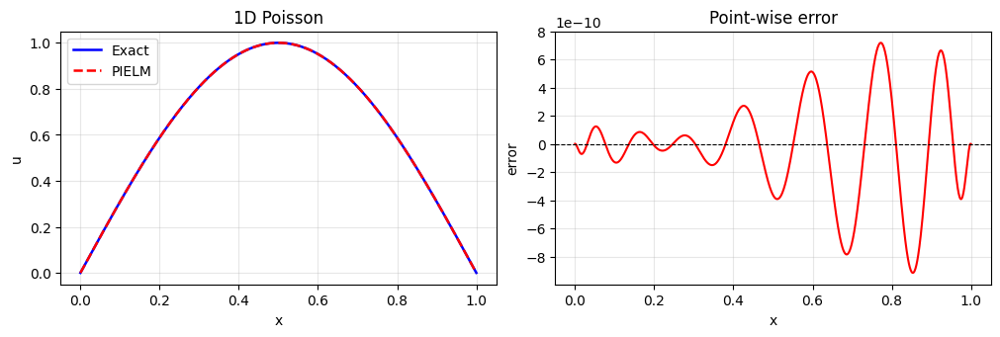

Info A: {'H_rows': 902, 'neurons': 981, 'ridge': 1e-08, 'dim': 1, 'time': False, 'const_feature': True}


In [137]:
# =============================================================
# Cell 6: Example A — 1D Poisson mother equation (Dirichlet 0,0)
# =============================================================
pi = np.pi
problem_A = {
    "name": "1D Poisson: u_xx = -pi^2 sin(pi x)",
    "dim": 1, "time": False,
    "coeffs": {"a0":0,"at":0,"att":0,"bx":0,"by":0,"cxx":1.0,"cxy":0,"cyy":0},
    "rhs": lambda x,y,t: - (pi**2) * np.sin(pi*x),
    "domain": {"x": (0.0, 1.0)},
    "bc": {
        "left":  {"type":"dirichlet", "value": lambda x,y,t: 0.0},
        "right": {"type":"dirichlet", "value": lambda x,y,t: 0.0},
    },
    "sampling": {"Nf": 900, "Nb": 20, "method":"halton"},
    "model":    {"neurons": 980, "activation":"tanh", "seed": 42, "ridge": 1e-8},
    "weights":  {"pde": 1.0, "bc": 30.0, "ic": 5.0},
    "plot":     {"exact": lambda x,y,t: np.sin(pi*x), "n_plot": 900}
}
predict_u_A, info_A = solve_problem(problem_A); print("Info A:", info_A)


Running TC-1 …


/var/folders/97/64q5gb_55n5dk9c9nd8xzdw00000gn/T/ipykernel_49457/3537235009.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  if a.size == 1: return np.full(n, float(a), float)


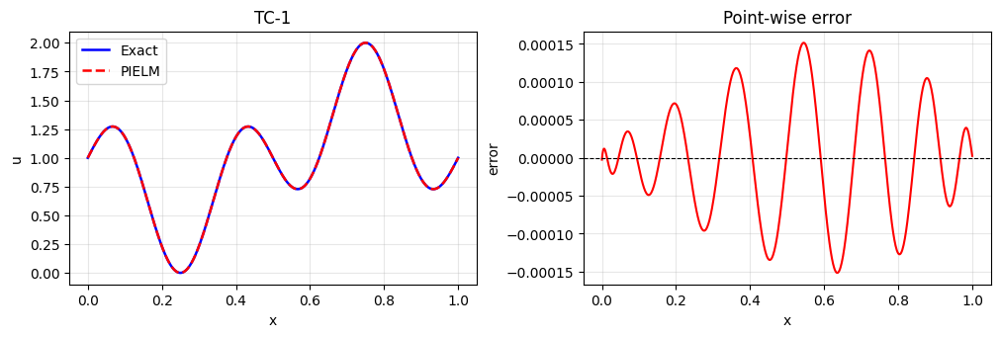

Running TC-2 …


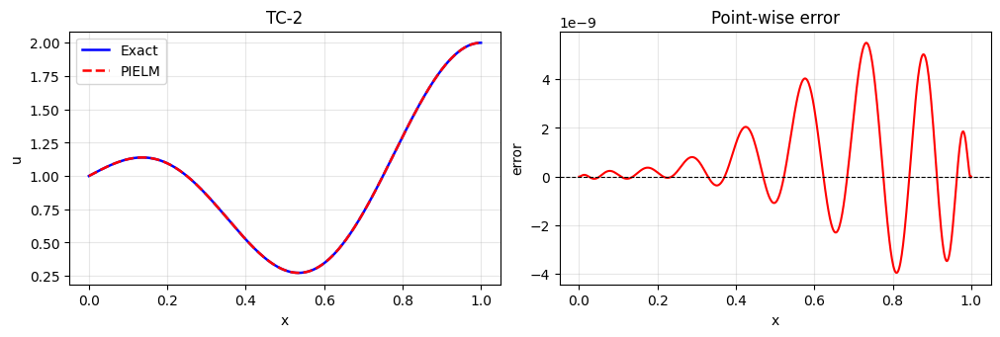

Running TC-3 …


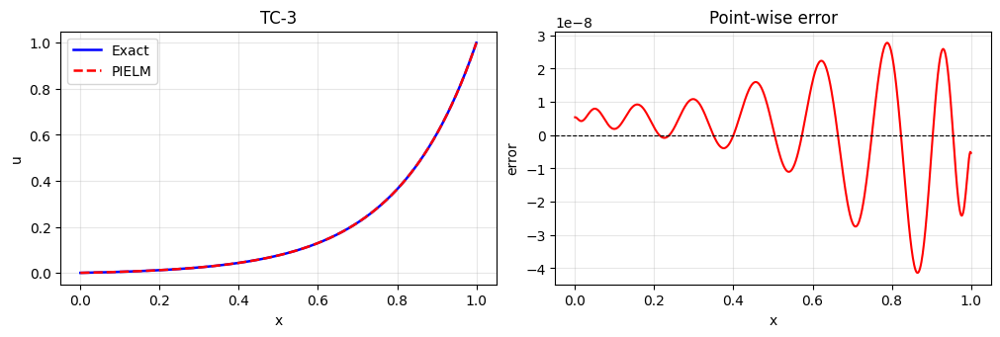

Running TC-4 …


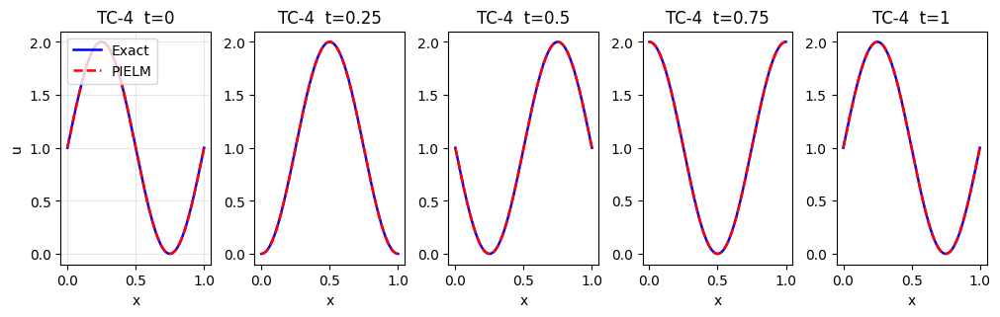

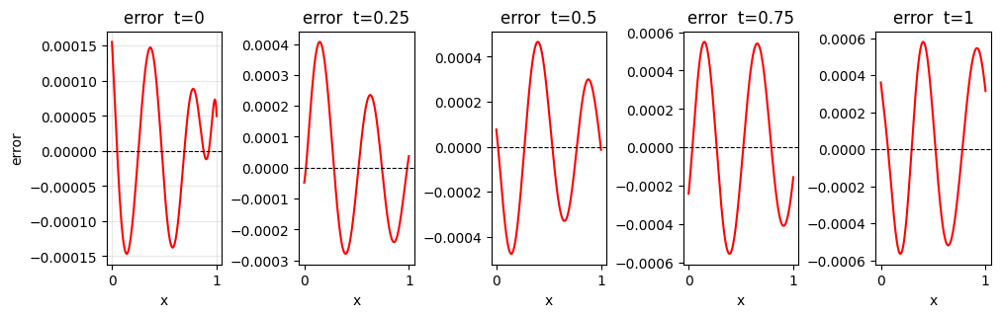

Running TC-5 …


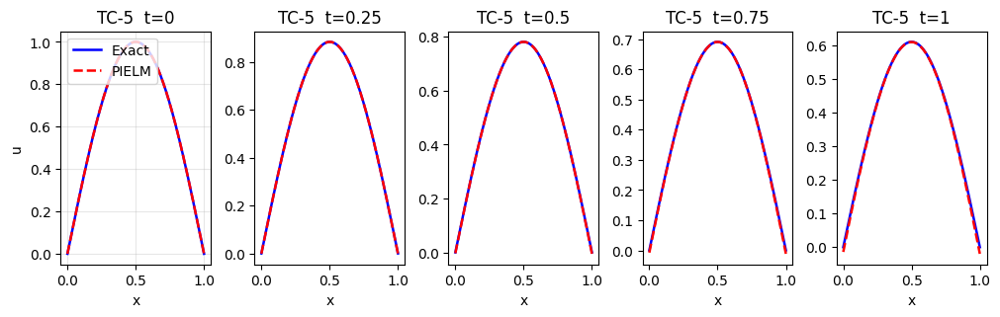

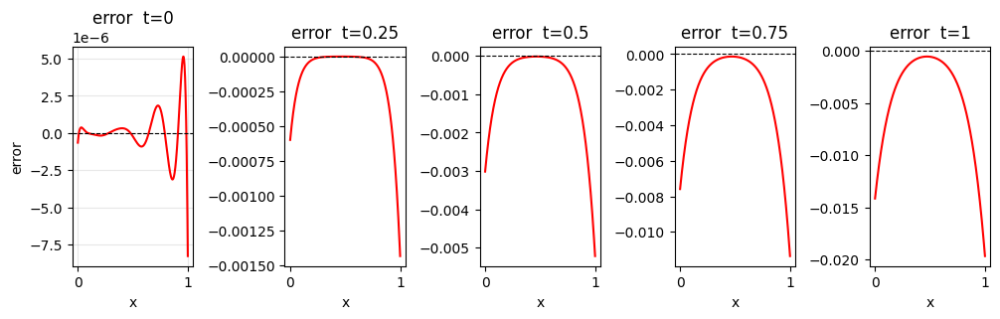

Running TC-6 …


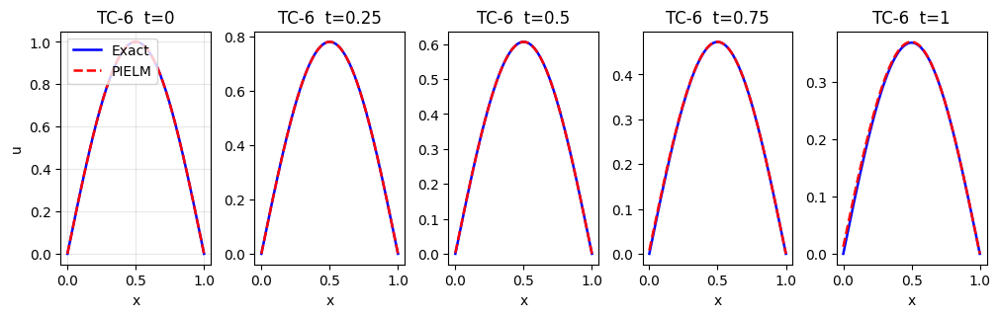

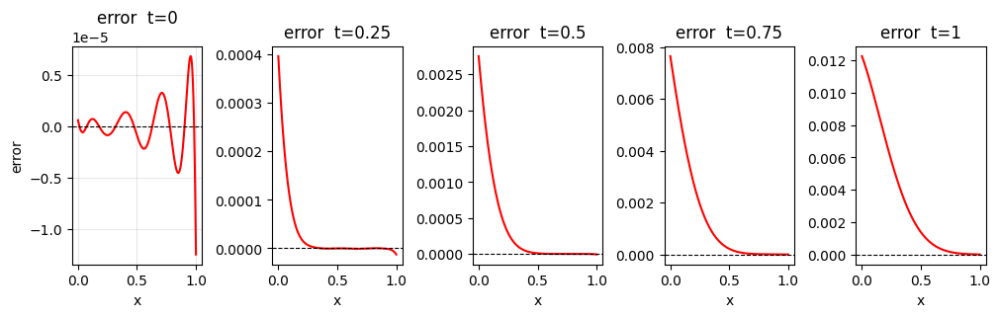

Running TC-7 …


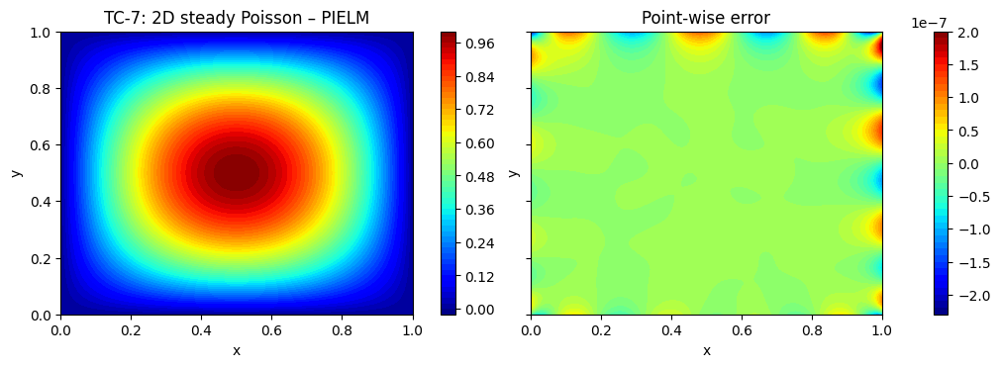

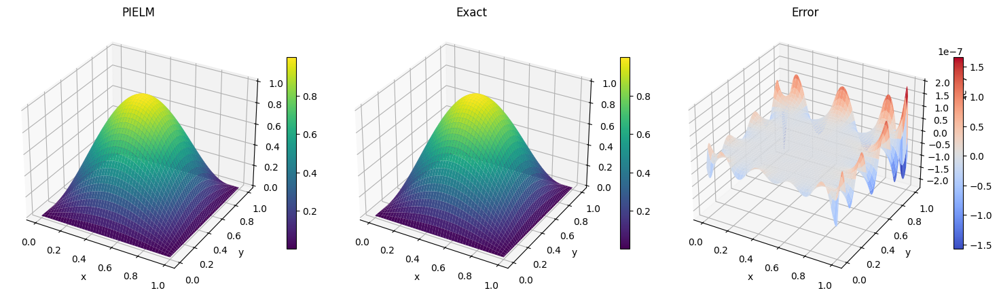

Running TC-8 …


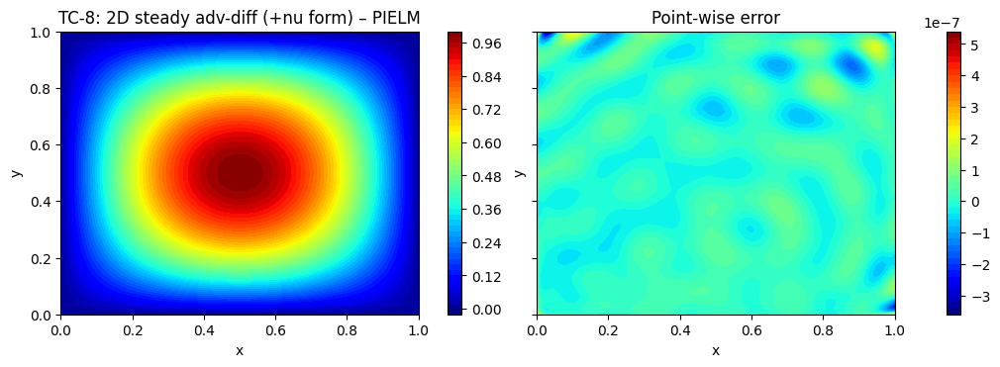

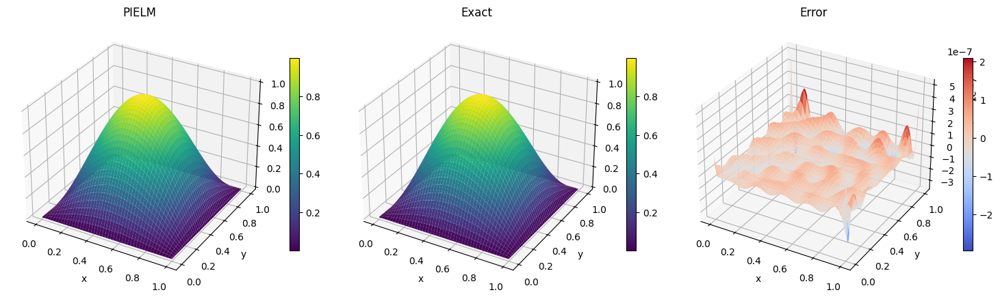

Running TC-9 …


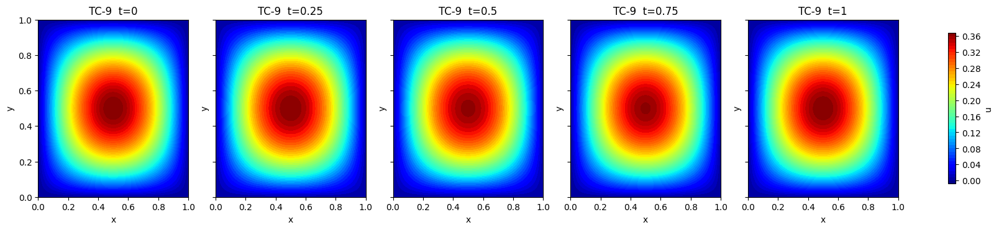

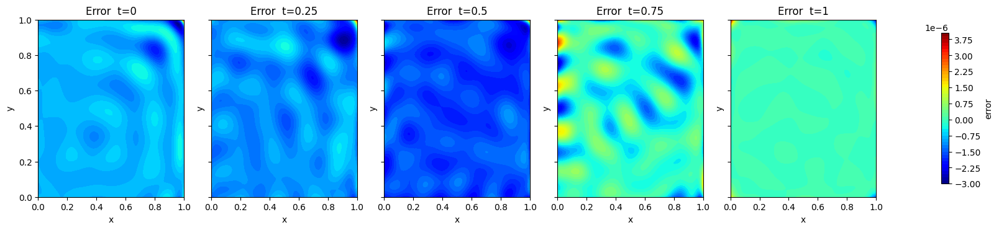

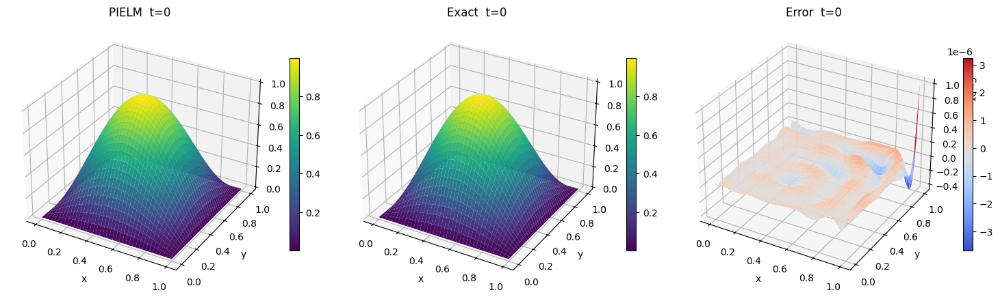

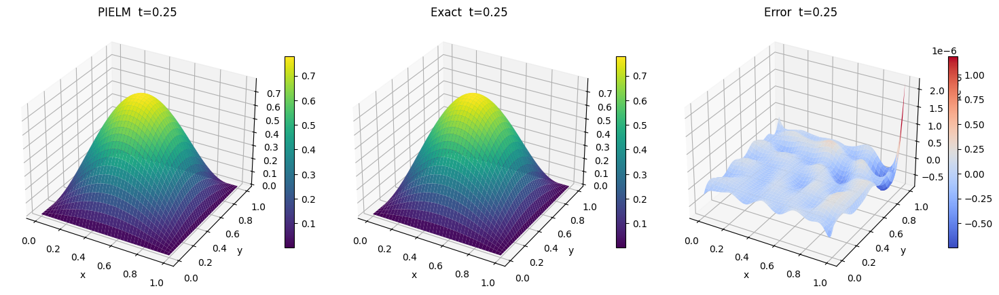

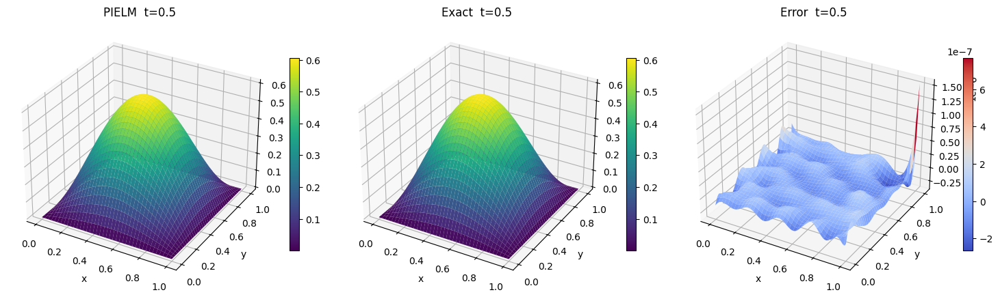

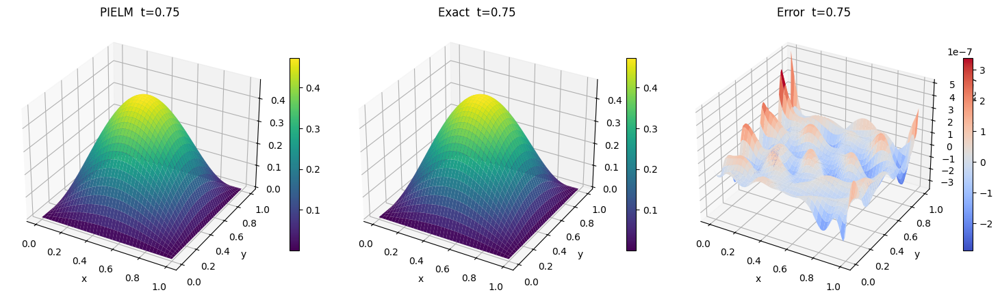

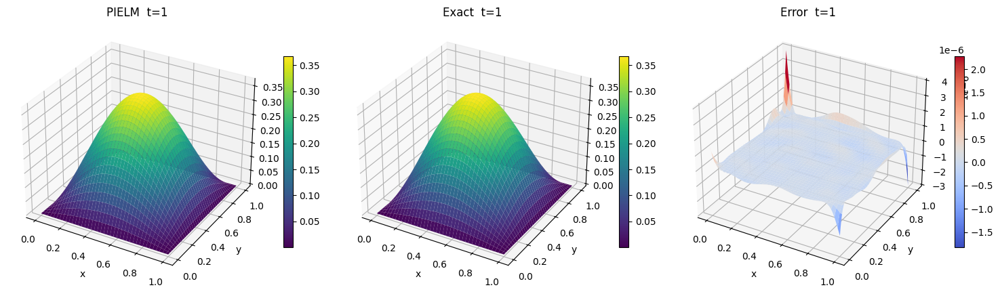

(<function __main__.solve_problem.<locals>.predict_u(x, y=None, t=None)>,
 {'H_rows': 13600,
  'neurons': 7001,
  'ridge': 1e-08,
  'dim': 2,
  'time': True,
  'const_feature': True})

In [138]:
# =============================================================
# Cell 7: Test cases TC-1 … TC-9 using the PIELM solver above
# =============================================================
def run_TC1():
    u_exact = lambda x,y,t: np.sin(2*np.pi*x) * np.cos(4*np.pi*x) + 1.0
    rhs = lambda x,y,t: 2*np.pi*np.cos(2*np.pi*x)*np.cos(4*np.pi*x) - 4*np.pi*np.sin(2*np.pi*x)*np.sin(4*np.pi*x)
    xL, xR = 0.0, 1.0; gL = float(u_exact(xL,0,0)); gR = float(u_exact(xR,0,0))
    prob = {
        "name":"TC-1: 1D steady advection","dim":1,"time":False,
        "coeffs":{"a0":0,"at":0,"att":0,"bx":1.0,"by":0,"cxx":0,"cxy":0,"cyy":0},
        "rhs": rhs, "domain":{"x":(xL,xR)},
        "bc":{"left":{"type":"dirichlet","value":lambda x,y,t:gL},
              "right":{"type":"dirichlet","value":lambda x,y,t:gR}},
        "sampling":{"Nf":1000,"Nb":2,"method":"halton"},
        "model":{"neurons":800,"activation":"tanh","seed":1,"ridge":1e-10},
        "weights":{"pde":1.0,"bc":10.0,"ic":5.0},
        "plot":{"exact":u_exact,"n_plot":600}
    }
    return solve_problem(prob)

def run_TC2():
    u_exact = lambda x,y,t: np.sin(0.5*np.pi*x) * np.cos(2*np.pi*x) + 1.0
    rhs = lambda x,y,t: - (17.0/4.0)*(np.pi**2)*np.sin(0.5*np.pi*x)*np.cos(2*np.pi*x) - 2.0*(np.pi**2)*np.cos(0.5*np.pi*x)*np.sin(2*np.pi*x)
    xL,xR=0.0,1.0; gL=float(u_exact(xL,0,0)); gR=float(u_exact(xR,0,0))
    prob = {
        "name":"TC-2: 1D steady Poisson","dim":1,"time":False,
        "coeffs":{"a0":0,"at":0,"att":0,"bx":0,"by":0,"cxx":1.0,"cxy":0,"cyy":0},
        "rhs":rhs,"domain":{"x":(xL,xR)},
        "bc":{"left":{"type":"dirichlet","value":lambda x,y,t:gL},
              "right":{"type":"dirichlet","value":lambda x,y,t:gR}},
        "sampling":{"Nf":1000,"Nb":2,"method":"halton"},
        "model":{"neurons":900,"activation":"tanh","seed":2,"ridge":1e-10},
        "plot":{"exact":u_exact,"n_plot":600}
    }
    return solve_problem(prob)

def run_TC3(nu=-0.20):
    u_exact = lambda x,y,t: (np.exp(x/(-nu)) - 1.0) / (np.exp(1.0/(-nu)) - 1.0)
    rhs = lambda x,y,t: np.zeros_like(x); xL,xR=0.0,1.0
    prob = {
        "name":"TC-3: 1D steady adv-diff","dim":1,"time":False,
        "coeffs":{"a0":0,"at":0,"att":0,"bx":1.0,"by":0,"cxx":float(nu),"cxy":0,"cyy":0},
        "rhs":rhs,"domain":{"x":(xL,xR)},
        "bc":{"left":{"type":"dirichlet","value":lambda x,y,t:0.0},
              "right":{"type":"dirichlet","value":lambda x,y,t:1.0}},
        "sampling":{"Nf":1000,"Nb":2,"method":"halton"},
        "model":{"neurons":800,"activation":"tanh","seed":3,"ridge":1e-10},
        "plot":{"exact":u_exact,"n_plot":600}
    }
    return solve_problem(prob)

def run_TC4():
    a=1.0
    u_exact=lambda x,y,t: 1.0 + np.sin(2*np.pi*(x - t)); rhs=lambda x,y,t: np.zeros_like(x)
    xL,xR=0.0,1.0
    prob={
        "name":"TC-4: 1D unsteady advection","dim":1,"time":True,
        "coeffs":{"a0":0,"at":1.0,"att":0,"bx":a,"by":0,"cxx":0,"cxy":0,"cyy":0},
        "rhs":rhs,"domain":{"x":(xL,xR),"t":(0.0,1.0)},
        "bc":{"type":"periodic"},
        "ic":{"u": lambda x,y,t: u_exact(x,y,0.0)},
        "sampling":{"Nf":2400,"Nb":400,"Ni":400,"Nt_slices":24,"method":"halton"},
        "model":{"neurons":1800,"activation":"tanh","seed":7,"ridge":1e-6},
        "plot":{"exact":u_exact,"n_plot":600,"times":[0.0,0.25,0.5,0.75,1.0]}
    }
    return solve_problem(prob)

def run_TC5():
    nu=-0.05
    u_exact=lambda x,y,t: np.sin(np.pi*x)*np.exp(-(abs(nu))*(np.pi**2)*t); rhs=lambda x,y,t: np.zeros_like(x)
    xL,xR=0.0,1.0
    prob={
        "name":"TC-5: 1D unsteady diffusion","dim":1,"time":True,
        "coeffs":{"a0":0,"at":1.0,"att":0,"bx":0,"by":0,"cxx":nu,"cxy":0,"cyy":0},
        "rhs":rhs,"domain":{"x":(xL,xR),"t":(0.0,1.0)},
        "bc":{"left":{"type":"dirichlet","value":lambda x,y,t:0.0},
              "right":{"type":"dirichlet","value":lambda x,y,t:0.0}},
        "ic":{"u": lambda x,y,t: u_exact(x,y,0.0)},
        "sampling":{"Nf":2400,"Nb":160,"Ni":400,"Nt_slices":24,"method":"halton"},
        "model":{"neurons":1800,"activation":"tanh","seed":8,"ridge":1e-6},
        "plot":{"exact":u_exact,"n_plot":600,"times":[0.0,0.25,0.5,0.75,1.0]}
    }
    return solve_problem(prob)

def run_TC6():
    a,nu=0.7,-0.02
    def u_exact(x,y,t): return np.sin(np.pi*x)*np.exp(-t)
    def rhs(x,y,t):
        x=np.asarray(x); ut=-np.sin(np.pi*x)*np.exp(-t); ux=np.pi*np.cos(np.pi*x)*np.exp(-t); uxx=-(np.pi**2)*np.sin(np.pi*x)*np.exp(-t)
        return ut + a*ux + nu*uxx
    xL,xR=0.0,1.0
    prob={
        "name":"TC-6: 1D unsteady advection–diffusion","dim":1,"time":True,
        "coeffs":{"a0":0,"at":1.0,"att":0,"bx":a,"by":0,"cxx":nu,"cxy":0,"cyy":0},
        "rhs":rhs,"domain":{"x":(xL,xR),"t":(0.0,1.0)},
        "bc":{"left":{"type":"dirichlet","value":lambda x,y,t:0.0},
              "right":{"type":"dirichlet","value":lambda x,y,t:0.0}},
        "ic":{"u": lambda x,y,t: u_exact(x,y,0.0)},
        "sampling":{"Nf":3000,"Nb":200,"Ni":500,"Nt_slices":28,"method":"halton"},
        "model":{"neurons":2000,"activation":"tanh","seed":4,"ridge":2e-6},
        "plot":{"exact":u_exact,"n_plot":600,"times":[0.0,0.25,0.5,0.75,1.0]}
    }
    return solve_problem(prob)

def run_TC7():
    u_exact=lambda x,y,t: np.sin(np.pi*x)*np.sin(np.pi*y)
    rhs=lambda x,y,t: -2*(np.pi**2)*np.sin(np.pi*x)*np.sin(np.pi*y)
    prob={
        "name":"TC-7: 2D steady Poisson","dim":2,"time":False,
        "coeffs":{"a0":0,"at":0,"att":0,"bx":0,"by":0,"cxx":1.0,"cxy":0,"cyy":1.0},
        "rhs":rhs,"domain":{"x":(0.0,1.0),"y":(0.0,1.0)},
        "bc":{"left":{"type":"dirichlet","value":lambda x,y,t:0.0},
              "right":{"type":"dirichlet","value":lambda x,y,t:0.0},
              "bottom":{"type":"dirichlet","value":lambda x,y,t:0.0},
              "top":{"type":"dirichlet","value":lambda x,y,t:0.0}},
        "sampling":{"Nf":5000,"Nb":400,"method":"halton"},
        "model":{"neurons":4000,"activation":"tanh","seed":3,"ridge":1e-8},
        "plot":{"exact":u_exact,"n_plot":140,"surface3d":True}
    }
    return solve_problem(prob)

def run_TC8():
    a,b,nu=1.0,1.0,0.01
    u_exact=lambda x,y,t: np.sin(np.pi*x)*np.sin(np.pi*y)
    def rhs(x,y,t):
        ux=np.pi*np.cos(np.pi*x)*np.sin(np.pi*y); uy=np.pi*np.sin(np.pi*x)*np.cos(np.pi*y)
        uxx=-(np.pi**2)*np.sin(np.pi*x)*np.sin(np.pi*y); uyy=-(np.pi**2)*np.sin(np.pi*x)*np.sin(np.pi*y)
        return a*ux + b*uy + nu*(uxx + uyy)
    prob={
        "name":"TC-8: 2D steady adv-diff (+nu form)","dim":2,"time":False,
        "coeffs":{"a0":0,"at":0,"att":0,"bx":a,"by":b,"cxx":nu,"cxy":0,"cyy":nu},
        "rhs":rhs,"domain":{"x":(0.0,1.0),"y":(0.0,1.0)},
        "bc":{"left":{"type":"dirichlet","value":lambda x,y,t: u_exact(0.0,y,0)},
              "right":{"type":"dirichlet","value":lambda x,y,t: u_exact(1.0,y,0)},
              "bottom":{"type":"dirichlet","value":lambda x,y,t: u_exact(x,0.0,0)},
              "top":{"type":"dirichlet","value":lambda x,y,t: u_exact(x,1.0,0)}},
        "sampling":{"Nf":6000,"Nb":600,"method":"halton"},
        "model":{"neurons":4500,"activation":"tanh","seed":5,"ridge":1e-8},
        "plot":{"exact":u_exact,"n_plot":140,"surface3d":True}
    }
    return solve_problem(prob)

def run_TC9():
    a,b,nu=0.5,0.3,-0.01
    u_xy=lambda x,y: np.sin(np.pi*x)*np.sin(np.pi*y)
    u_exact=lambda x,y,t: u_xy(x,y)*np.exp(-t)
    def rhs(x,y,t):
        ut=-u_xy(x,y)*np.exp(-t)
        ux=np.pi*np.cos(np.pi*x)*np.sin(np.pi*y)*np.exp(-t)
        uy=np.pi*np.sin(np.pi*x)*np.cos(np.pi*y)*np.exp(-t)
        uxx=-(np.pi**2)*u_xy(x,y)*np.exp(-t); uyy=-(np.pi**2)*u_xy(x,y)*np.exp(-t)
        return ut + a*ux + b*uy + nu*(uxx + uyy)
    prob={
        "name":"TC-9: 2D unsteady adv-diff (nu<0, +nu form)","dim":2,"time":True,
        "coeffs":{"a0":0,"at":1.0,"att":0,"bx":a,"by":b,"cxx":nu,"cxy":0,"cyy":nu},
        "rhs":rhs,"domain":{"x":(0.0,1.0),"y":(0.0,1.0),"t":(0.0,1.0)},
        "bc":{"left":{"type":"dirichlet","value":lambda x,y,t: u_exact(0.0,y,t)},
              "right":{"type":"dirichlet","value":lambda x,y,t: u_exact(1.0,y,t)},
              "bottom":{"type":"dirichlet","value":lambda x,y,t: u_exact(x,0.0,t)},
              "top":{"type":"dirichlet","value":lambda x,y,t: u_exact(x,1.0,t)}},
        "ic":{"u": lambda x,y,t: u_exact(x,y,0.0)},
        "sampling":{"Nf":12000,"Nb":800,"Ni":800,"Nt_slices":24,"method":"halton"},
        "model":{"neurons":7000,"activation":"tanh","seed":11,"ridge":1e-8},
        "plot":{"exact":u_exact,"n_plot":120,"times":[0.0,0.25,0.5,0.75,1.0],"surface3d":True}
    }
    return solve_problem(prob)

print("Running TC-1 …"); run_TC1()
print("Running TC-2 …"); run_TC2()
print("Running TC-3 …"); run_TC3()
print("Running TC-4 …"); run_TC4()
print("Running TC-5 …"); run_TC5()
print("Running TC-6 …"); run_TC6()
print("Running TC-7 …"); run_TC7()
print("Running TC-8 …"); run_TC8()
print("Running TC-9 …"); run_TC9()



Running RAN-1 (1D steady adv-diff, a(x), nu<0) …


/var/folders/97/64q5gb_55n5dk9c9nd8xzdw00000gn/T/ipykernel_49457/3537235009.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  if a.size == 1: return np.full(n, float(a), float)


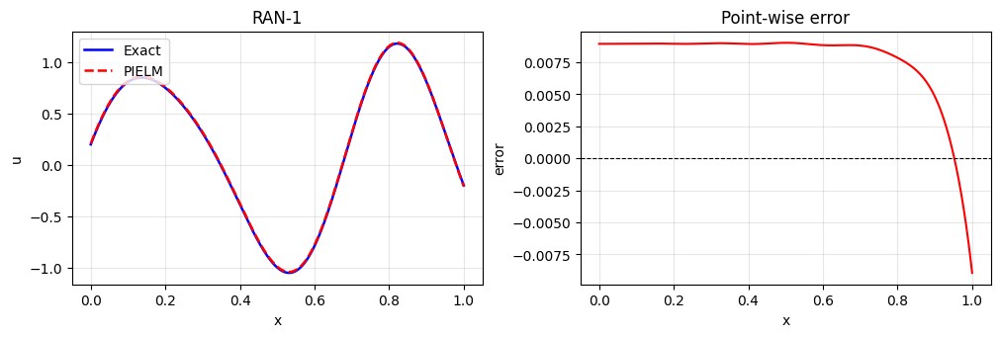

[Eval 1D steady] rel-L2 = 1.153e-02

Running RAN-2 (1D unsteady advection, periodic) …


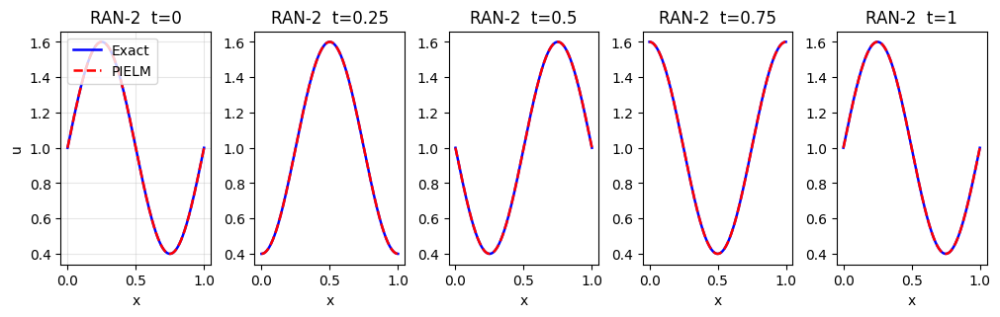

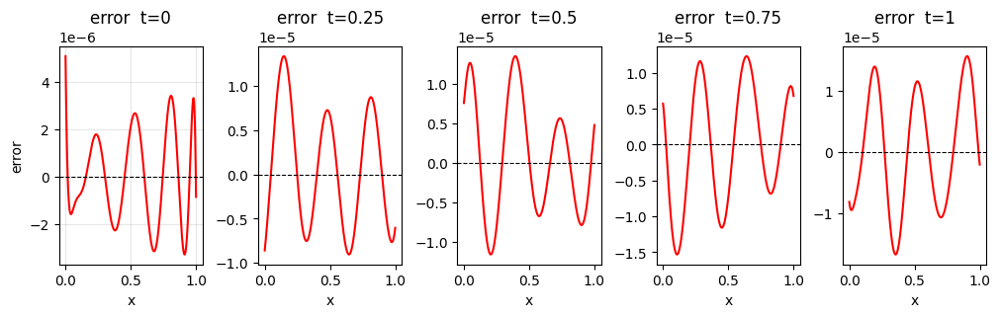

[Eval 1D unsteady @ t=0.00] rel-L2 = 1.738e-06
[Eval 1D unsteady @ t=0.25] rel-L2 = 6.138e-06
[Eval 1D unsteady @ t=0.50] rel-L2 = 6.714e-06
[Eval 1D unsteady @ t=0.75] rel-L2 = 7.551e-06
[Eval 1D unsteady @ t=1.00] rel-L2 = 8.676e-06
[Eval 1D unsteady] max rel-L2 over times = 8.676e-06

Running RAN-3 (2D steady adv-diff, +nu) …


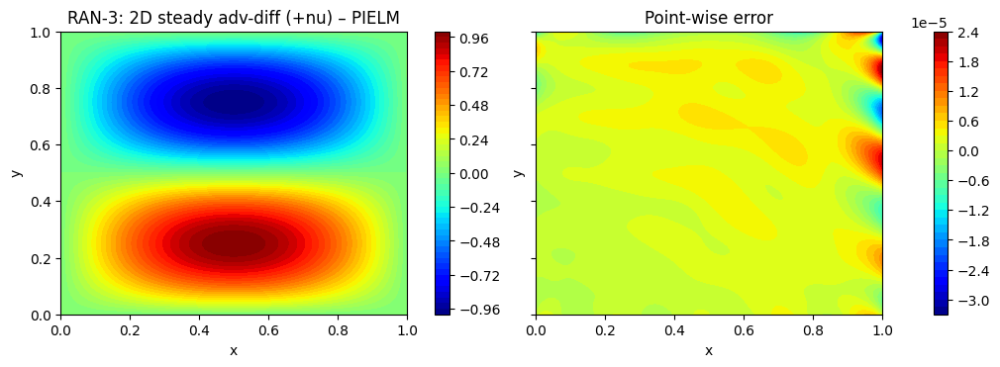

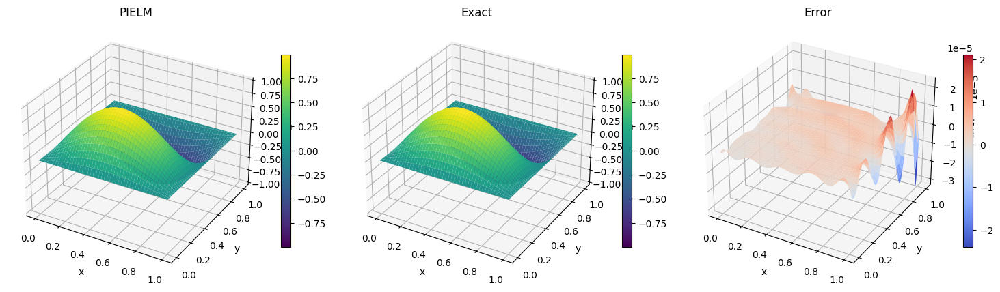

[Eval 2D steady] rel-L2 = 6.814e-06

Running RAN-4 (2D unsteady adv-diff, a(x,y), b(x,y), nu<0) …


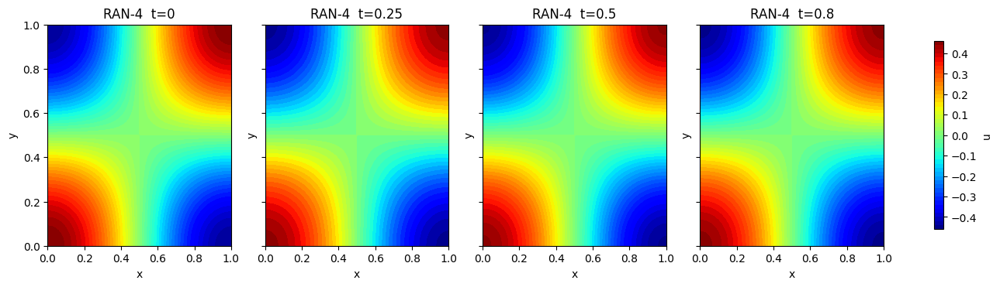

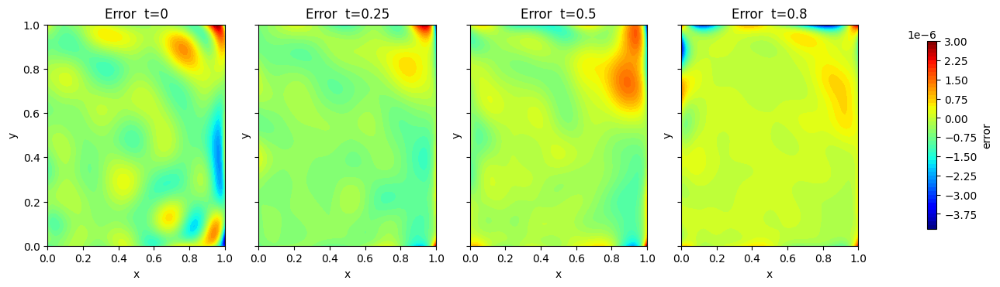

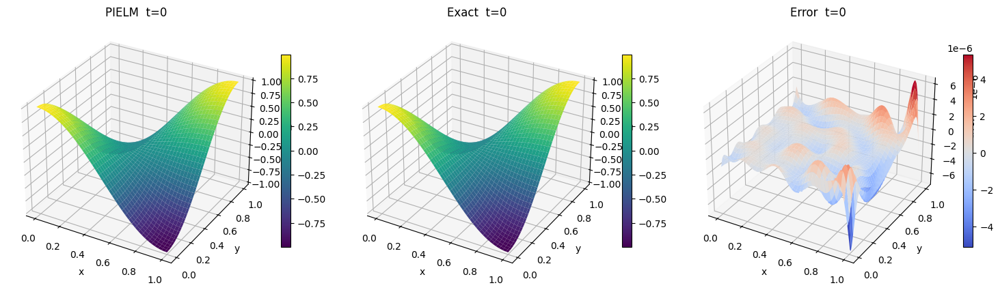

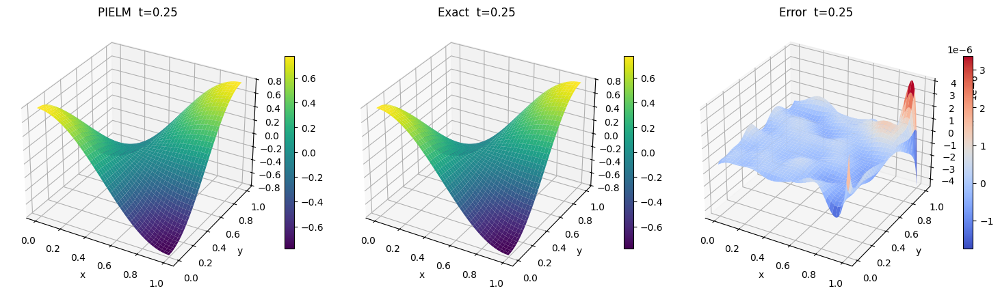

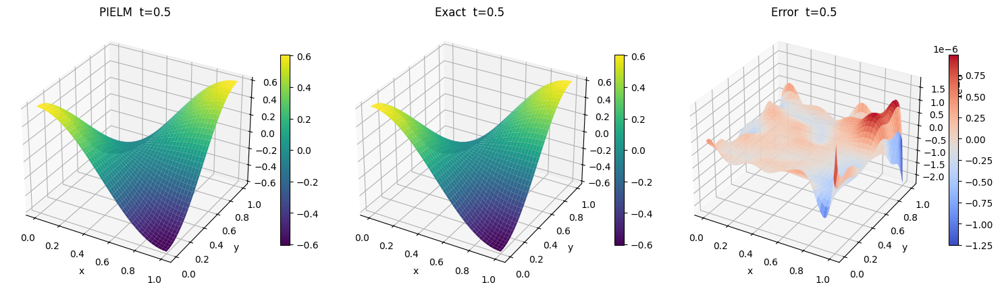

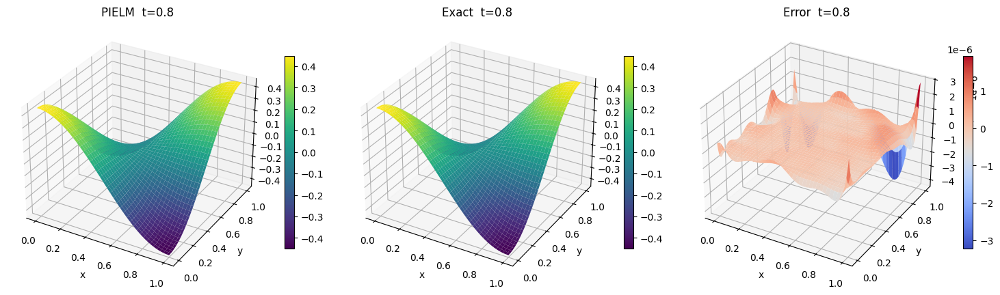

[Eval 2D unsteady @ t=0.00] rel-L2 = 1.946e-06
[Eval 2D unsteady @ t=0.25] rel-L2 = 1.070e-06
[Eval 2D unsteady @ t=0.50] rel-L2 = 8.967e-07
[Eval 2D unsteady @ t=0.80] rel-L2 = 1.840e-06
[Eval 2D unsteady] max rel-L2 over times = 1.946e-06


In [139]:
# =============================================================
# Runners for 4 seeded "random" cases using the *new* solver API
# Requires: solve_problem(problem) from your new solver
# =============================================================

import numpy as np

# ---------- tiny evaluation helpers ----------
def _rel_l2(a, b):
    a = np.asarray(a).ravel(); b = np.asarray(b).ravel()
    num = np.linalg.norm(a - b); den = max(1e-14, np.linalg.norm(b))
    return float(num / den)

def eval_1d_steady(predict_u, u_exact, xL=0.0, xR=1.0, n=2000):
    x = np.linspace(xL, xR, n)
    up = predict_u(x)
    ue = u_exact(x)
    rel = _rel_l2(up, ue); print(f"[Eval 1D steady] rel-L2 = {rel:.3e}")
    return rel

def eval_1d_time(predict_u, u_exact, xL=0.0, xR=1.0, times=(0.0,0.25,0.5,0.75,1.0), n=1200):
    x = np.linspace(xL, xR, n); errs=[]
    for t in times:
        up = predict_u(x, t=np.full_like(x, t))
        ue = u_exact(x, np.full_like(x, t))
        errs.append(_rel_l2(up, ue))
    for t,e in zip(times, errs):
        print(f"[Eval 1D unsteady @ t={t:.2f}] rel-L2 = {e:.3e}")
    print(f"[Eval 1D unsteady] max rel-L2 over times = {max(errs):.3e}")
    return errs

def eval_2d_rect_steady(predict_u, u_exact, xL=0.0, xR=1.0, yL=0.0, yR=1.0, n=120):
    xs, ys = np.linspace(xL,xR,n), np.linspace(yL,yR,n)
    xx, yy = np.meshgrid(xs, ys)
    up = predict_u(xx.ravel(), yy.ravel()).reshape(n,n)
    ue = u_exact(xx, yy)
    rel = _rel_l2(up, ue); print(f"[Eval 2D steady] rel-L2 = {rel:.3e}")
    return rel

def eval_2d_rect_time(predict_u, u_exact, xL=0.0, xR=1.0, yL=0.0, yR=1.0, times=(0.0,0.3,0.6,1.0), n=80):
    xs, ys = np.linspace(xL,xR,n), np.linspace(yL,yR,n)
    xx, yy = np.meshgrid(xs, ys); errs=[]
    for t in times:
        up = predict_u(xx.ravel(), yy.ravel(), t=np.full(xx.size, t)).reshape(n,n)
        ue = u_exact(xx, yy, t)
        errs.append(_rel_l2(up, ue))
    for t,e in zip(times, errs):
        print(f"[Eval 2D unsteady @ t={t:.2f}] rel-L2 = {e:.3e}")
    print(f"[Eval 2D unsteady] max rel-L2 over times = {max(errs):.3e}")
    return errs

# -------------------------------------------------------------
# RAN-1: 1D steady adv-diff with variable a(x)
#  Mother eq: bx(x) u_x + cxx u_xx = rhs(x)   (at=0, a0=0, etc.)
# -------------------------------------------------------------
# (helpers unchanged)

def run_RAN1():
    xL, xR = 0.0, 1.0
    nu = -0.10
    u_exact = lambda x: np.sin(3*np.pi*x) + 0.2*np.cos(5*np.pi*x)
    ux  = lambda x:  3*np.pi*np.cos(3*np.pi*x) - np.pi*np.sin(5*np.pi*x)
    uxx = lambda x: -9*(np.pi**2)*np.sin(3*np.pi*x) - 5*(np.pi**2)*np.cos(5*np.pi*x)
    a_fun = lambda x, y=None: 1.0 + 0.5*x

    rhs = lambda x,y,t: a_fun(x)*ux(x) + nu*uxx(x)

    gL = float(u_exact(xL)); gR = float(u_exact(xR))
    problem = {
        "name": "RAN-1: 1D steady adv-diff (a(x), nu<0)",
        "dim": 1, "time": False,
        "coeffs": {"a0":0,"at":0,"att":0, "bx":a_fun, "by":0, "cxx":nu, "cxy":0, "cyy":0},
        "rhs": rhs,
        "domain": {"x": (xL, xR)},
        "bc": {
            "left":  {"type":"dirichlet", "value": lambda x,y,t: gL},
            "right": {"type":"dirichlet", "value": lambda x,y,t: gR},
        },
        "sampling": {"Nf": 600, "Nb": 40, "method":"halton"},
        "model":    {"neurons": 700, "activation":"tanh", "seed": 101, "ridge": 1e-8},
        "weights":  {"pde": 1.0, "bc": 3.0, "ic": 1.0},
        "plot":     {"exact": lambda x,y,t: u_exact(x), "n_plot": 900}
    }
    predict_u, info = solve_problem(problem)
    eval_1d_steady(predict_u, u_exact, xL, xR)
    return predict_u, info

def run_RAN2():
    a = 1.0
    u_exact = lambda x,t: 1.0 + 0.6*np.sin(2*np.pi*(x - t))
    rhs = lambda x,y,t: np.zeros_like(x)

    xL, xR = 0.0, 1.0
    problem = {
        "name":"RAN-2: 1D unsteady advection (periodic)",
        "dim":1, "time": True,
        "coeffs": {"a0":0,"at":1.0,"att":0, "bx":a,"by":0, "cxx":0,"cxy":0,"cyy":0},
        "rhs": rhs,
        "domain": {"x": (xL,xR), "t": (0.0, 1.0)},
        "bc": {"type":"periodic"},
        "ic": {"u": lambda x,y,t: u_exact(x, 0.0)},
        "sampling": {"Nf": 1800, "Nb": 300, "Ni": 600, "Nt_slices": 32, "method":"halton"},
        "model": {"neurons": 2200, "activation":"tanh", "seed": 202, "ridge": 1e-8, "const_feature": False},
        "weights": {"pde":1.0, "bc":8.0, "ic":10.0},
        "plot": {"exact": lambda x,y,t: u_exact(x,t), "n_plot": 900,
                 "times":[0.0,0.25,0.5,0.75,1.0]}
    }
    predict_u, info = solve_problem(problem)
    eval_1d_time(predict_u, u_exact, xL, xR, times=[0.0,0.25,0.5,0.75,1.0])
    return predict_u, info

def run_RAN3():
    a, b, nu_val = 0.3, -0.5, 0.02
    def u_exact_xy(x,y): return np.sin(np.pi*x)*np.sin(2*np.pi*y)
    def rhs(x,y,t):
        ux  =  np.pi*np.cos(np.pi*x)*np.sin(2*np.pi*y)
        uy  =  2*np.pi*np.sin(np.pi*x)*np.cos(2*np.pi*y)
        uxx = - (np.pi**2)*np.sin(np.pi*x)*np.sin(2*np.pi*y)
        uyy = - (2*np.pi)**2*np.sin(np.pi*x)*np.sin(2*np.pi*y)
        return a*ux + b*uy + nu_val*(uxx + uyy)

    xL,xR,yL,yR = 0.0,1.0,0.0,1.0
    g = lambda x,y,t: u_exact_xy(x,y)
    problem = {
        "name":"RAN-3: 2D steady adv-diff (+nu)",
        "dim":2, "time":False,
        "coeffs":{"a0":0,"at":0,"att":0, "bx":a,"by":b, "cxx":nu_val,"cxy":0,"cyy":nu_val},
        "rhs": rhs,
        "domain":{"x":(xL,xR),"y":(yL,yR)},
        "bc":{
            "left":{"type":"dirichlet","value":g},
            "right":{"type":"dirichlet","value":g},
            "bottom":{"type":"dirichlet","value":g},
            "top":{"type":"dirichlet","value":g},
        },
        "sampling":{"Nf": 3000, "Nb": 420, "method":"halton"},
        "model":{"neurons": 3500, "activation":"tanh", "seed": 303, "ridge": 1e-8},
        "weights":{"pde":1.0, "bc":3.0, "ic":1.0},
        "plot":{"exact": lambda x,y,t: u_exact_xy(x,y), "n_plot":140, "surface3d": True}
    }
    predict_u, info = solve_problem(problem)
    eval_2d_rect_steady(predict_u, u_exact_xy, xL,xR,yL,yR, n=120)
    return predict_u, info

def run_RAN4():
    nu = -0.01
    a_fun = lambda x,y: 0.4 + 0.2*np.sin(2*np.pi*x)
    b_fun = lambda x,y: -0.3 + 0.1*np.cos(2*np.pi*y)

    def u_exact(x,y,t): return np.cos(np.pi*x)*np.cos(np.pi*y)*np.exp(-t)
    def rhs(x,y,t):
        ut  = -np.cos(np.pi*x)*np.cos(np.pi*y)*np.exp(-t)
        ux  = -np.pi*np.sin(np.pi*x)*np.cos(np.pi*y)*np.exp(-t)
        uy  = -np.pi*np.cos(np.pi*x)*np.sin(np.pi*y)*np.exp(-t)
        uxx = - (np.pi**2)*np.cos(np.pi*x)*np.cos(np.pi*y)*np.exp(-t)
        uyy = - (np.pi**2)*np.cos(np.pi*x)*np.cos(np.pi*y)*np.exp(-t)
        return ut + a_fun(x,y)*ux + b_fun(x,y)*uy + nu*(uxx + uyy)

    times = [0.0, 0.25, 0.5, 0.8]
    xL,xR,yL,yR = 0.0,1.0,0.0,1.0
    g = lambda x,y,t: u_exact(x,y,t)
    problem = {
        "name":"RAN-4: 2D unsteady adv-diff (a(x,y),b(x,y), nu<0)",
        "dim":2, "time":True,
        "coeffs":{"a0":0,"at":1.0,"att":0, "bx":a_fun,"by":b_fun, "cxx":nu,"cxy":0,"cyy":nu},
        "rhs": rhs,
        "domain":{"x":(xL,xR),"y":(yL,yR),"t":(0.0, max(times))},
        "bc":{
            "left":{"type":"dirichlet","value":g},
            "right":{"type":"dirichlet","value":g},
            "bottom":{"type":"dirichlet","value":g},
            "top":{"type":"dirichlet","value":g},
        },
        "ic":{"u": lambda x,y,t: u_exact(x,y,0.0)},
        "sampling":{"Nf": 7000, "Nb": 600, "Ni": 600, "Nt_slices": 24, "method":"halton"},
        "model":{"neurons": 8000, "activation":"tanh", "seed": 404, "ridge": 1e-8},
        "weights":{"pde":1.0, "bc":2.0, "ic":1.0},
        "plot":{"exact": u_exact, "n_plot":120, "times": times, "surface3d": True}
    }
    predict_u, info = solve_problem(problem)
    eval_2d_rect_time(predict_u, u_exact, xL,xR,yL,yR, times=times, n=80)
    return predict_u, info

# ---------- run all four ----------
if __name__ == "__main__":
    print("\nRunning RAN-1 (1D steady adv-diff, a(x), nu<0) …")
    run_RAN1()
    print("\nRunning RAN-2 (1D unsteady advection, periodic) …")
    run_RAN2()
    print("\nRunning RAN-3 (2D steady adv-diff, +nu) …")
    run_RAN3()
    print("\nRunning RAN-4 (2D unsteady adv-diff, a(x,y), b(x,y), nu<0) …")
    run_RAN4()


/var/folders/97/64q5gb_55n5dk9c9nd8xzdw00000gn/T/ipykernel_49457/3537235009.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  if a.size == 1: return np.full(n, float(a), float)


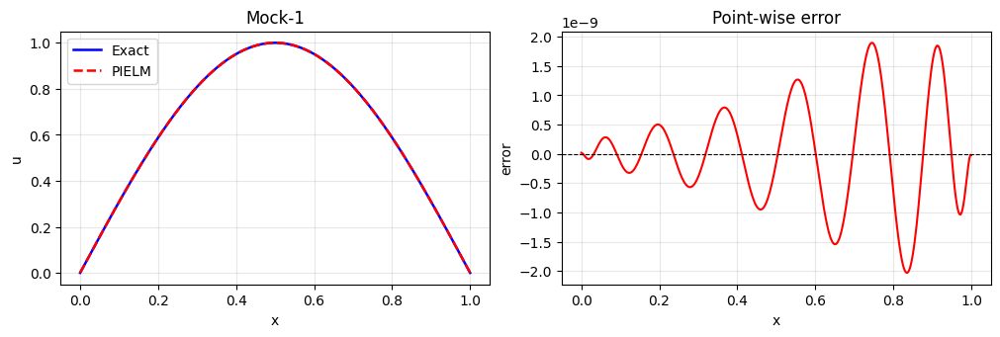

Info: {'H_rows': 802, 'neurons': 901, 'ridge': 1e-08, 'dim': 1, 'time': False, 'const_feature': True}


In [140]:
# =============================================================
# Mock Config 1 — 1D steady Poisson
# u_xx = -pi^2 sin(pi x), u(0)=u(1)=0
# =============================================================
pi = np.pi
problem_mock1 = {
    "name": "Mock-1: 1D steady Poisson",
    "dim": 1, "time": False,
    "coeffs": {"a0":0,"at":0,"att":0,"bx":0,"by":0,"cxx":1.0,"cxy":0,"cyy":0},
    "rhs": lambda x,y,t: - (pi**2) * np.sin(pi*x),
    "domain": {"x": (0.0,1.0)},
    "bc": {
        "left":  {"type":"dirichlet","value":0.0},
        "right": {"type":"dirichlet","value":0.0}
    },
    "sampling": {"Nf":800,"Nb":40,"method":"halton"},
    "model": {"neurons":900,"activation":"tanh","seed":11,"ridge":1e-8},
    "plot": {"exact": lambda x,y,t: np.sin(pi*x), "n_plot":400}
}
predict1, info1 = solve_problem(problem_mock1); print("Info:", info1)


/var/folders/97/64q5gb_55n5dk9c9nd8xzdw00000gn/T/ipykernel_49457/3537235009.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  if a.size == 1: return np.full(n, float(a), float)


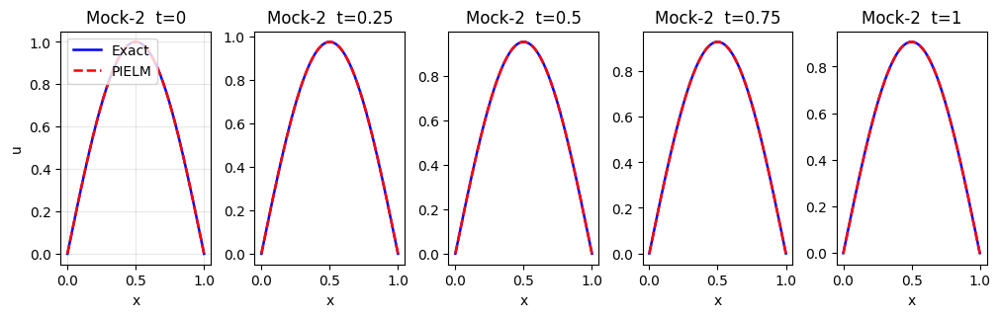

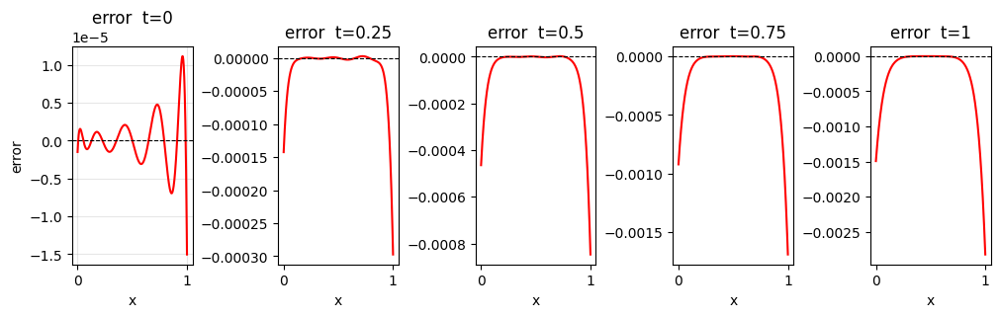

Info: {'H_rows': 2302, 'neurons': 1801, 'ridge': 1e-06, 'dim': 1, 'time': True, 'const_feature': True}


In [141]:
# =============================================================
# Mock Config 2 — 1D unsteady diffusion
# u_t = 0.01 u_xx, IC: sin(pi x), u(0,t)=u(1,t)=0
# =============================================================
problem_mock2 = {
    "name": "Mock-2: 1D unsteady diffusion",
    "dim": 1, "time": True,
    "coeffs": {"a0":0,"at":1.0,"att":0,"bx":0,"by":0,"cxx":-0.01,"cxy":0,"cyy":0},
    "rhs": 0.0,
    "domain": {"x":(0.0,1.0), "t":(0.0,1.0)},
    "bc": {
        "left":  {"type":"dirichlet","value":0.0},
        "right": {"type":"dirichlet","value":0.0}
    },
    "ic": {"u": lambda x,y,t: np.sin(pi*x)},
    "sampling": {"Nf":2000,"Nb":100,"Ni":300,"Nt_slices":24,"method":"halton"},
    "model": {"neurons":1800,"activation":"tanh","seed":22,"ridge":1e-6},
    "plot": {"exact": lambda x,y,t: np.sin(pi*x)*np.exp(-0.01*(pi**2)*t),
             "n_plot":600,"times":[0.0,0.25,0.5,0.75,1.0]}
}
predict2, info2 = solve_problem(problem_mock2); print("Info:", info2)


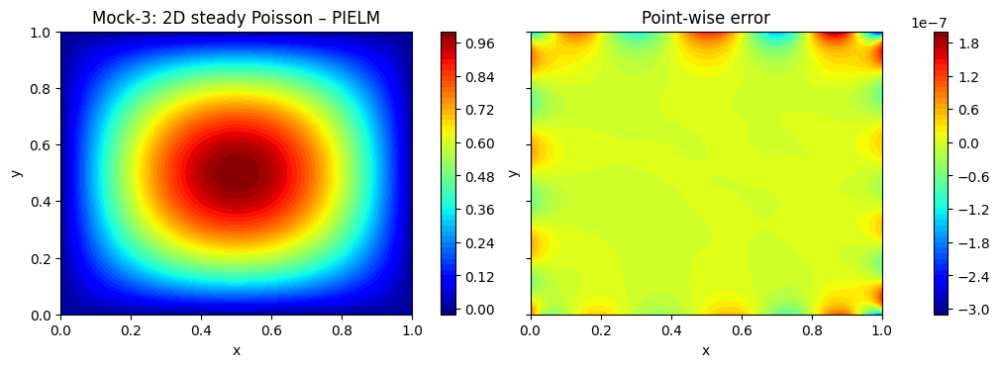

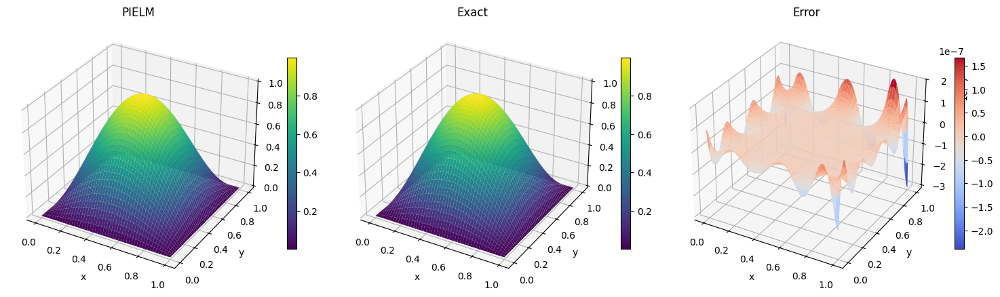

Info: {'H_rows': 4400, 'neurons': 3501, 'ridge': 1e-08, 'dim': 2, 'time': False, 'const_feature': True}


In [142]:
# =============================================================
# Mock Config 3 — 2D steady Poisson
# u_xx + u_yy = -2 pi^2 sin(pi x) sin(pi y), u=0 on boundary
# =============================================================
problem_mock3 = {
    "name": "Mock-3: 2D steady Poisson",
    "dim": 2, "time": False,
    "coeffs": {"a0":0,"at":0,"att":0,"bx":0,"by":0,"cxx":1.0,"cxy":0,"cyy":1.0},
    "rhs": lambda x,y,t: -2*(pi**2)*np.sin(pi*x)*np.sin(pi*y),
    "domain": {"x":(0.0,1.0), "y":(0.0,1.0)},
    "bc": {
        "left":   {"type":"dirichlet","value":0.0},
        "right":  {"type":"dirichlet","value":0.0},
        "bottom": {"type":"dirichlet","value":0.0},
        "top":    {"type":"dirichlet","value":0.0}
    },
    "sampling": {"Nf":4000,"Nb":400,"method":"halton"},
    "model": {"neurons":3500,"activation":"tanh","seed":33,"ridge":1e-8},
    "plot": {"exact": lambda x,y,t: np.sin(pi*x)*np.sin(pi*y),
             "n_plot":100,"surface3d":True}
}
predict3, info3 = solve_problem(problem_mock3); print("Info:", info3)


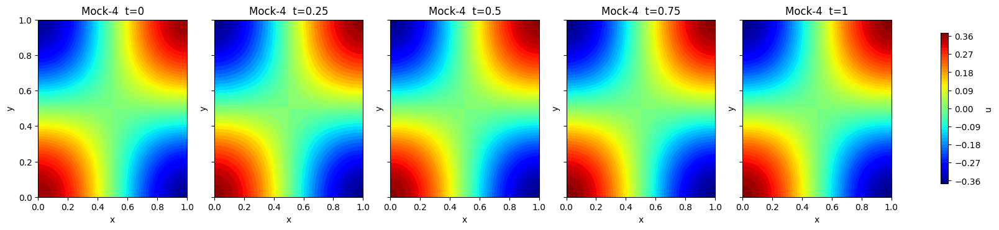

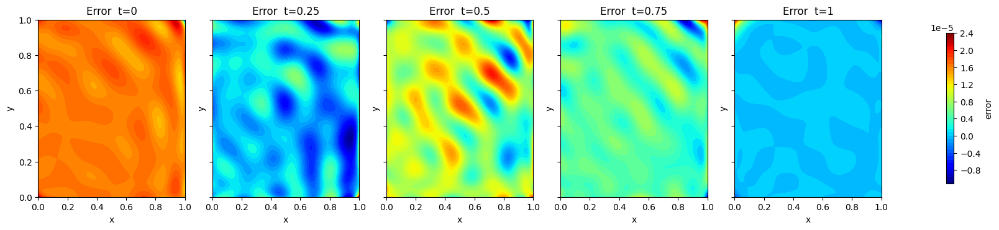

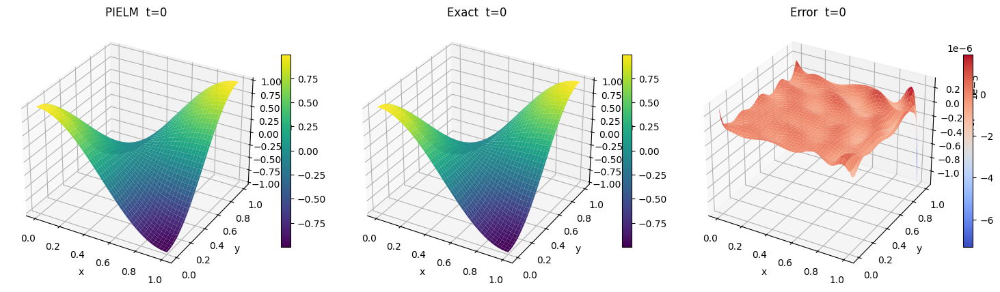

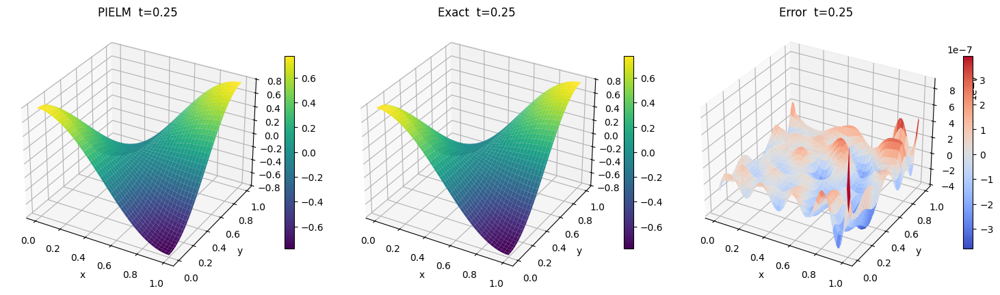

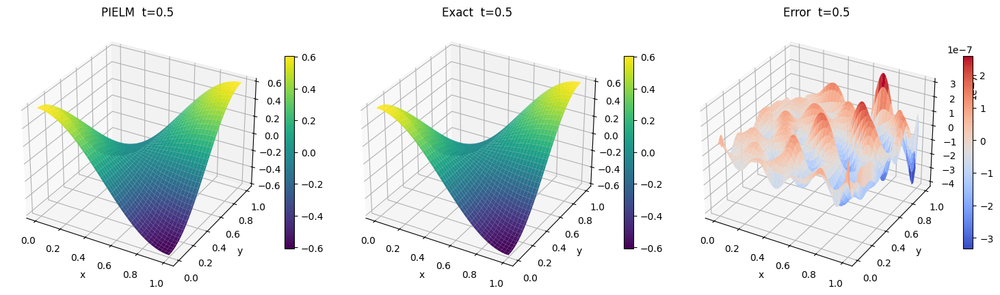

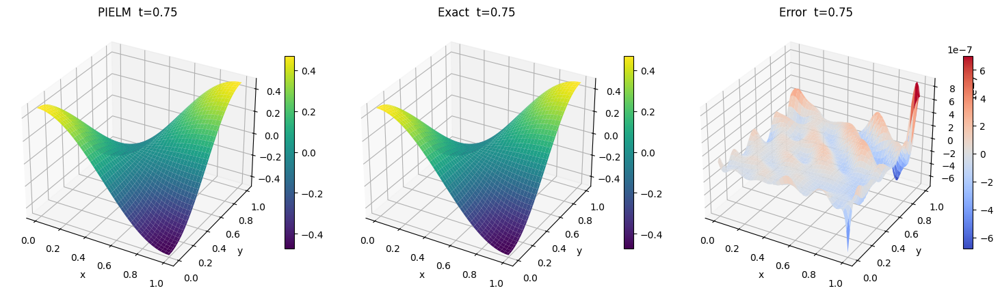

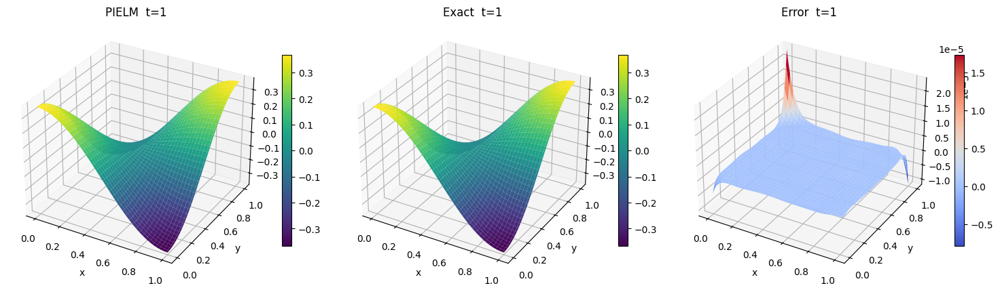

Info: {'H_rows': 8000, 'neurons': 7001, 'ridge': 1e-08, 'dim': 2, 'time': True, 'const_feature': True}


In [143]:
# =============================================================
# Mock Config 4 — 2D unsteady advection–diffusion
# u_t + 0.5 u_x - 0.3 u_y -0.01(u_xx+u_yy)=0
# IC: cos(pi x) cos(pi y), Dirichlet=IC on all boundaries
# =============================================================
problem_mock4 = {
    "name": "Mock-4: 2D unsteady adv-diff",
    "dim": 2, "time": True,
    "coeffs": {"a0":0,"at":1.0,"att":0,"bx":0.5,"by":-0.3,"cxx":-0.01,"cxy":0,"cyy":-0.01},
    "rhs": lambda x,y,t: (
        -1 * np.cos(np.pi*x)*np.cos(np.pi*y)*np.exp(-t)                         # u_t
        + 0.5 * (-np.pi*np.sin(np.pi*x)*np.cos(np.pi*y)*np.exp(-t))         # + 0.5 u_x
        - 0.3 * (-np.pi*np.cos(np.pi*x)*np.sin(np.pi*y)*np.exp(-t))         # - 0.3 u_y
        - 0.01 * ( - (np.pi**2)*np.cos(np.pi*x)*np.cos(np.pi*y)*np.exp(-t)  # -0.01 (u_xx + u_yy)
                + - (np.pi**2)*np.cos(np.pi*x)*np.cos(np.pi*y)*np.exp(-t) )
    ),

    "domain": {"x":(0.0,1.0), "y":(0.0,1.0), "t":(0.0,1.0)},
    "bc": {
        "left":   {"type":"dirichlet","value":lambda x,y,t: np.cos(pi*x)*np.cos(pi*y)*np.exp(-t)},
        "right":  {"type":"dirichlet","value":lambda x,y,t: np.cos(pi*x)*np.cos(pi*y)*np.exp(-t)},
        "bottom": {"type":"dirichlet","value":lambda x,y,t: np.cos(pi*x)*np.cos(pi*y)*np.exp(-t)},
        "top":    {"type":"dirichlet","value":lambda x,y,t: np.cos(pi*x)*np.cos(pi*y)*np.exp(-t)}
    },
    "ic": {"u": lambda x,y,t: np.cos(pi*x)*np.cos(pi*y)},
    "sampling": {"Nf":7000,"Nb":500,"Ni":500,"Nt_slices":24,"method":"halton"},
    "model": {"neurons":7000,"activation":"tanh","seed":44,"ridge":1e-8},
    "plot": {"exact": lambda x,y,t: np.cos(pi*x)*np.cos(pi*y)*np.exp(-t),
             "n_plot":80,"times":[0.0,0.25,0.5,0.75,1.0],"surface3d":True}
}
predict4, info4 = solve_problem(problem_mock4); print("Info:", info4)


/var/folders/97/64q5gb_55n5dk9c9nd8xzdw00000gn/T/ipykernel_49457/3537235009.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  if a.size == 1: return np.full(n, float(a), float)


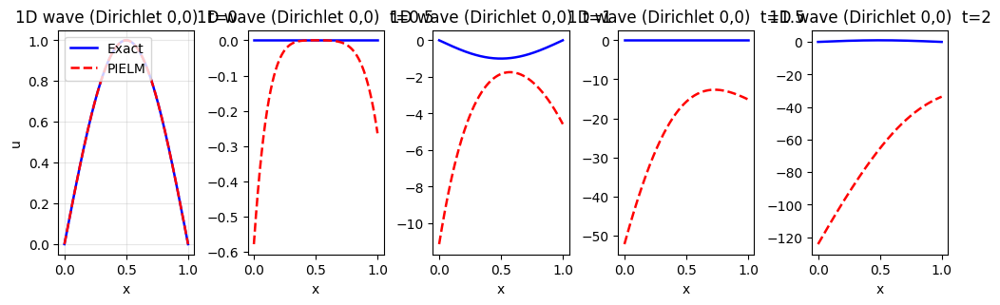

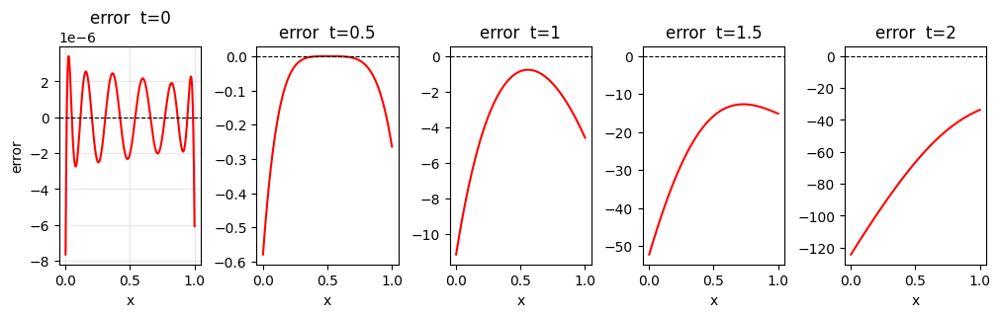

In [144]:
# c = 1; u_tt - u_xx = 0  => att=1.0, cxx=-1.0
pi = np.pi
u0  = lambda x: np.sin(pi*x)              # u(x,0)
ut0 = lambda x: 0.0                       # u_t(x,0)

u_exact = lambda x,t: np.sin(pi*x)*np.cos(pi*t)

prob_wave = {
    "name":"1D wave (Dirichlet 0,0)",
    "dim":1, "time":True,
    "coeffs":{"a0":0,"at":0,"att":1.0,"bx":0,"by":0,"cxx":-1.0,"cxy":0,"cyy":0},
    "rhs": lambda x,y,t: 0.0,
    "domain":{"x":(0.0,1.0), "t":(0.0,2.0)},
    "bc":{
        "left":{"type":"dirichlet","value":0.0},
        "right":{"type":"dirichlet","value":0.0}
    },
    "ic":{"u":lambda x,y,t: u0(x), "ut": lambda x,y,t: ut0(x)},
    "sampling":{"Nf":4000,"Nb":200,"Ni":600,"Nt_slices":24,"method":"halton","time_mode":"mixed"},
    "model":{"neurons":3500,"activation":"tanh","seed":12,"ridge":1e-8},
    "weights":{"pde":1.0,"bc":10.0,"ic":25.0},
    "plot":{"exact":lambda x,y,t: u_exact(x,t), "n_plot":600, "times":[0,0.5,1.0,1.5,2.0]}
}
predict_u, info = solve_problem(prob_wave)


/var/folders/97/64q5gb_55n5dk9c9nd8xzdw00000gn/T/ipykernel_49457/3537235009.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  if a.size == 1: return np.full(n, float(a), float)


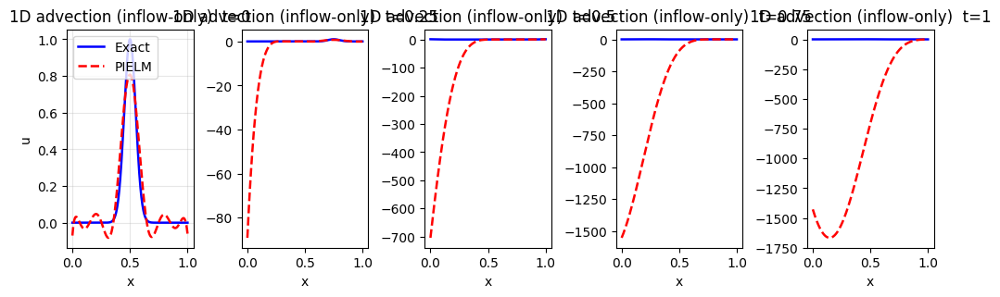

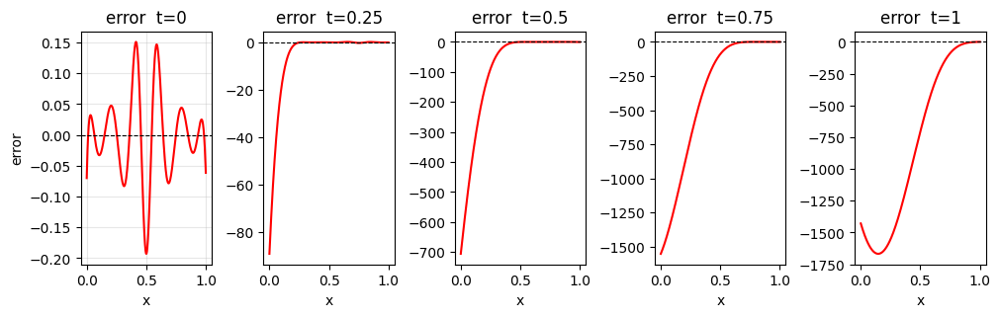

In [145]:
# u_t + a u_x = 0, a>0; inflow at x=0 only; initial condition given
a = 1.0
u0 = lambda x: np.exp(-200*(x-0.5)**2)
u_exact = lambda x,t: u0((x - a*t) % 1.0)   # on [0,1] you can either wrap (periodic) or not

prob_adv_inflow = {
    "name":"1D advection (inflow-only)",
    "dim":1, "time":True,
    "coeffs":{"a0":0,"at":1.0,"att":0,"bx":a,"by":0,"cxx":0,"cxy":0,"cyy":0},
    "rhs": lambda x,y,t: 0.0,
    "domain":{"x":(0.0,1.0), "t":(0.0,1.0)},
    # inflow at x=0: prescribe boundary there only; NO right boundary
    "bc":{"left":{"type":"dirichlet","value": lambda x,y,t: u0(0.0)}},
    "ic":{"u": lambda x,y,t: u0(x)},
    "sampling":{"Nf":2500,"Nb":120,"Ni":400,"Nt_slices":24,"method":"halton","time_mode":"slices"},
    "model":{"neurons":2500,"activation":"tanh","seed":13,"ridge":1e-8},
    "weights":{"pde":1.0,"bc":5.0,"ic":15.0},
    "plot":{"exact":lambda x,y,t: u_exact(x,t), "n_plot":600, "times":[0,0.25,0.5,0.75,1.0]}
}
predict_u, info = solve_problem(prob_adv_inflow)


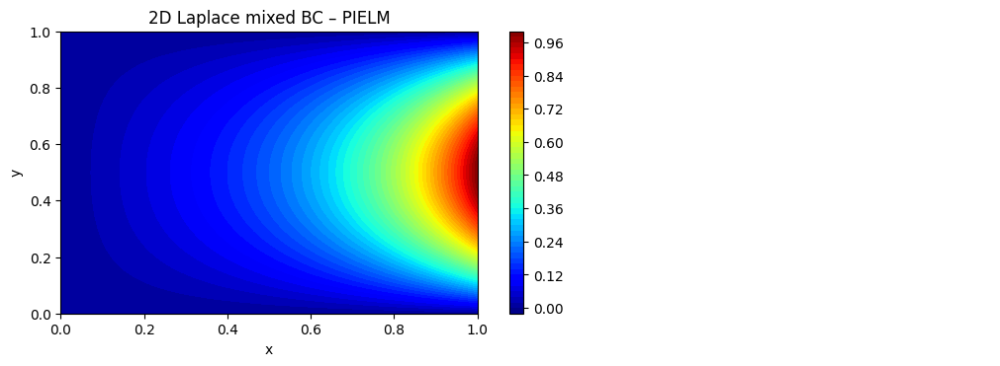

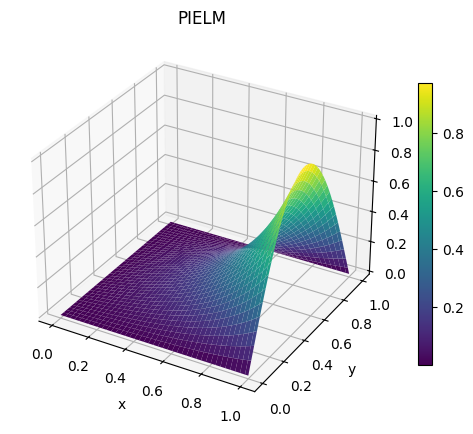

Info: {'H_rows': 5600, 'neurons': 4201, 'ridge': 1e-08, 'dim': 2, 'time': False, 'const_feature': True}


In [146]:
problem_laplace2d = {
    "name": "2D Laplace mixed BC",
    "dim": 2, "time": False,
    "coeffs": {"a0":0,"at":0,"att":0,"bx":0,"by":0,"cxx":1.0,"cxy":0,"cyy":1.0},
    "rhs": 0.0,
    "domain": {"x":(0.0,1.0), "y":(0.0,1.0)},
    "bc": {
        "left":   {"type":"dirichlet","value":0.0},
        "right":  {"type":"dirichlet","value":lambda x,y,t: np.sin(pi*y)},
        "bottom": {"type":"dirichlet","value":0.0},
        "top":    {"type":"dirichlet","value":0.0}
    },
    "sampling": {"Nf":5000,"Nb":600,"method":"halton"},
    "model": {"neurons":4200,"activation":"tanh","seed":77,"ridge":1e-8},
    "plot": {"exact": None, "n_plot":120,"surface3d":True}
}
predict_laplace2d, info_laplace2d = solve_problem(problem_laplace2d); print("Info:", info_laplace2d)


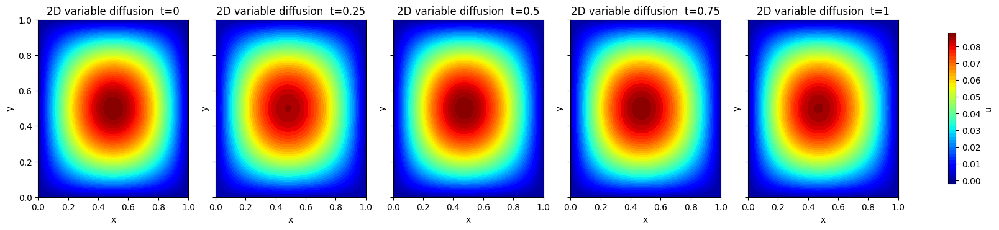

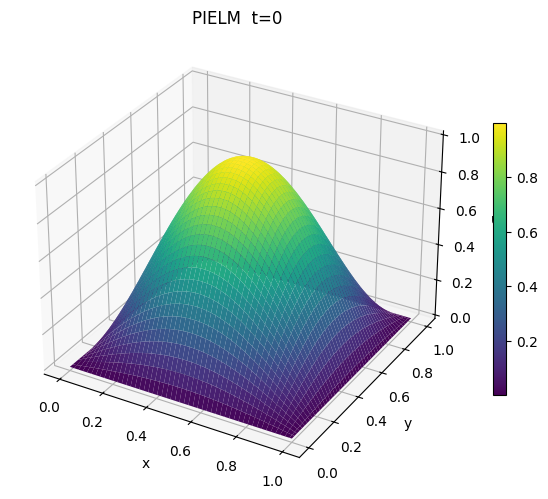

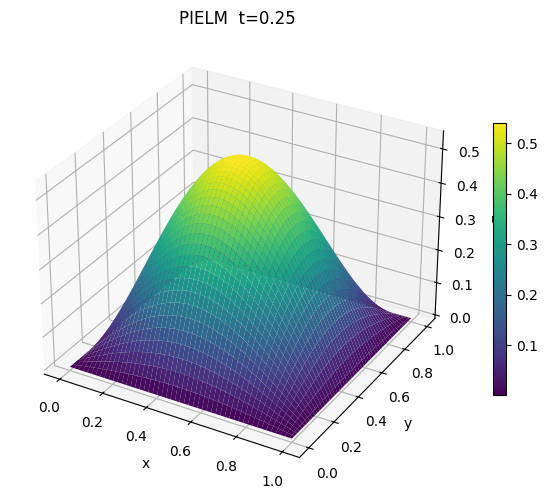

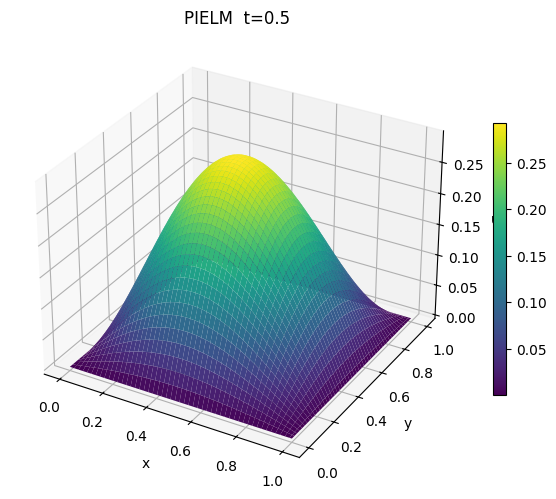

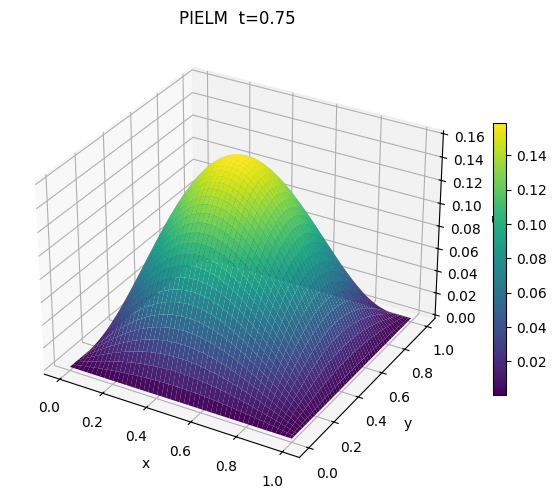

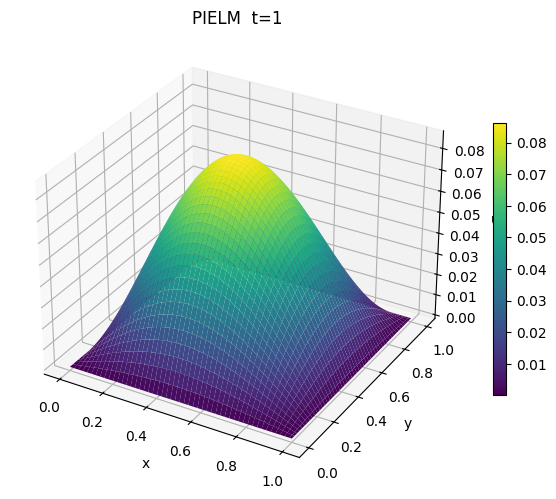

Info: {'H_rows': 10600, 'neurons': 7500, 'ridge': 1e-08, 'dim': 2, 'time': True, 'const_feature': False}


In [147]:
diff_coeff = lambda x,y: 0.1 + 0.05*x
problem_var2d = {
    "name": "2D variable diffusion",
    "dim": 2, "time": True,
    "coeffs": {
        "a0":0,"at":1.0,"att":0,
        "bx":0,"by":0,
        "cxx": lambda x,y,t: -diff_coeff(x,y),
        "cxy":0,
        "cyy": lambda x,y,t: -diff_coeff(x,y)
    },
    "rhs": 0.0,
    "domain": {"x":(0.0,1.0), "y":(0.0,1.0), "t":(0.0,1.0)},
    "bc": {
        "left":   {"type":"dirichlet","value":0.0},
        "right":  {"type":"dirichlet","value":0.0},
        "bottom": {"type":"dirichlet","value":0.0},
        "top":    {"type":"dirichlet","value":0.0}
    },
    "ic": {"u": lambda x,y,t: np.sin(pi*x)*np.sin(pi*y)},
    "sampling": {"Nf":9000,"Nb":800,"Ni":800,"Nt_slices":24,"method":"halton"},
    "model": {"neurons":7500,"activation":"tanh","seed":99,"ridge":1e-8},
    "plot": {"exact": None, "n_plot":100,"times":[0.0,0.25,0.5,0.75,1.0], "surface3d" : True}
}
predict_var2d, info_var2d = solve_problem(problem_var2d); print("Info:", info_var2d)
